# Siamese Few-Shot Learning: Full Project Viewer

This notebook is a single place to inspect the saved project artifacts, report-ready sections, figures, metrics, failure analysis, and selected source files.

What this notebook can show:

- `SYSTEM_DESCRIPTION.md`
- `REPORT_SUBMISSION_READY_SECTIONS.md`
- saved evaluation metrics and training histories
- generated figures
- failure summaries and failure CSVs
- dataset-specific generated reports
- selected source files from the implementation

Recommended usage:

1. Run the setup cells first.
2. Run the summary cells to inspect metrics and failures.
3. Use the dataset viewer cell for a single experiment.
4. Run the all-datasets cell if you want the full artifact dump.


In [1]:
from pathlib import Path
import json
import re

import pandas as pd
from IPython.display import Markdown, display, Image as IPyImage

pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", 120)
pd.set_option("display.float_format", lambda x: f"{x:.4f}")

ROOT = Path.cwd()
PROJECT_ROOT = ROOT if (ROOT / "outputs").exists() else ROOT / "siamese-few-shot-learning"
if not PROJECT_ROOT.exists():
    raise FileNotFoundError("Could not locate the project root. Open this notebook from the repository root or the project folder.")

RESULTS_DIR = PROJECT_ROOT / "outputs" / "results"
FIGURES_DIR = PROJECT_ROOT / "outputs" / "figures"
MODELS_DIR = PROJECT_ROOT / "outputs" / "models"
REPORT_ASSETS_DIR = PROJECT_ROOT / "report_assets"

DATASETS = [
    "mnist",
    "fashion_mnist",
    "fashion_products_small",
    "amharic_handwritten",
    "ethiopian_textile_local",
]

DATASET_TITLES = {
    "mnist": "MNIST",
    "fashion_mnist": "Fashion-MNIST",
    "fashion_products_small": "Fashion Product Images Small",
    "amharic_handwritten": "Amharic Handwritten Characters",
    "ethiopian_textile_local": "Ethiopian Cultural Clothing and Textile",
}

SOURCE_FILES = [
    "config.py",
    "dataset.py",
    "model.py",
    "loss.py",
    "train.py",
    "evaluate.py",
    "pipeline.py",
    "report.py",
    "app.py",
    "main.py",
]

DOCS = {
    "system_description": PROJECT_ROOT / "SYSTEM_DESCRIPTION.md",
    "submission_sections": PROJECT_ROOT / "REPORT_SUBMISSION_READY_SECTIONS.md",
}

print(f"Project root: {PROJECT_ROOT}")
print(f"Results dir:  {RESULTS_DIR}")
print(f"Figures dir:  {FIGURES_DIR}")
print(f"Models dir:   {MODELS_DIR}")


Project root: C:\Users\coop\OneDrive\Documents\Desktop\Collection Latest\Few Shot Learning\siamese-few-shot-learning
Results dir:  C:\Users\coop\OneDrive\Documents\Desktop\Collection Latest\Few Shot Learning\siamese-few-shot-learning\outputs\results
Figures dir:  C:\Users\coop\OneDrive\Documents\Desktop\Collection Latest\Few Shot Learning\siamese-few-shot-learning\outputs\figures
Models dir:   C:\Users\coop\OneDrive\Documents\Desktop\Collection Latest\Few Shot Learning\siamese-few-shot-learning\outputs\models


In [2]:
def read_json(path: Path):
    return json.loads(path.read_text(encoding="utf-8"))

def read_text(path: Path):
    return path.read_text(encoding="utf-8")

def experiment_paths(dataset: str):
    return {
        "metrics": RESULTS_DIR / f"evaluation_metrics_{dataset}.json",
        "history": RESULTS_DIR / f"training_history_{dataset}.json",
        "failure_summary": RESULTS_DIR / f"failure_summary_{dataset}.json",
        "failure_csv": RESULTS_DIR / f"one_shot_failure_analysis_{dataset}.csv",
        "results_csv": RESULTS_DIR / f"results_table_{dataset}.csv",
        "report": PROJECT_ROOT / f"report_{dataset}.md",
        "checkpoint": MODELS_DIR / f"siamese_{dataset}.pt",
        "figures": {
            "loss_curve": FIGURES_DIR / f"loss_curve_{dataset}.png",
            "sample_pairs": FIGURES_DIR / f"sample_pairs_{dataset}.png",
            "tsne_plot": FIGURES_DIR / f"tsne_plot_{dataset}.png",
            "one_shot_examples": FIGURES_DIR / f"one_shot_examples_{dataset}.png",
        },
    }

def extract_report_setup(report_text: str):
    patterns = {
        "batch_size": r"- Batch size: ([0-9]+)",
        "train_pairs_per_epoch": r"- Train pairs per epoch: ([0-9]+)",
        "val_pairs": r"- Validation pairs: ([0-9]+)",
        "embedding_dimension": r"- Embedding dimension: ([0-9]+)",
        "margin": r"- Contrastive margin: ([0-9.]+)",
        "one_shot_way": r"- One-shot setting: ([0-9]+)-way, ([0-9]+) trials",
    }
    data = {
        "batch_size": None,
        "train_pairs_per_epoch": None,
        "val_pairs": None,
        "embedding_dimension": None,
        "margin": None,
        "one_shot_way": None,
        "one_shot_trials": None,
    }
    batch = re.search(patterns["batch_size"], report_text)
    train_pairs = re.search(patterns["train_pairs_per_epoch"], report_text)
    val_pairs = re.search(patterns["val_pairs"], report_text)
    embedding = re.search(patterns["embedding_dimension"], report_text)
    margin = re.search(patterns["margin"], report_text)
    setting = re.search(patterns["one_shot_way"], report_text)
    if batch:
        data["batch_size"] = int(batch.group(1))
    if train_pairs:
        data["train_pairs_per_epoch"] = int(train_pairs.group(1))
    if val_pairs:
        data["val_pairs"] = int(val_pairs.group(1))
    if embedding:
        data["embedding_dimension"] = int(embedding.group(1))
    if margin:
        data["margin"] = float(margin.group(1))
    if setting:
        data["one_shot_way"] = int(setting.group(1))
        data["one_shot_trials"] = int(setting.group(2))
    return data

def load_experiment(dataset: str):
    paths = experiment_paths(dataset)
    report_text = read_text(paths["report"]) if paths["report"].exists() else ""
    return {
        "dataset": dataset,
        "title": DATASET_TITLES[dataset],
        "paths": paths,
        "metrics": read_json(paths["metrics"]) if paths["metrics"].exists() else {},
        "history": read_json(paths["history"]) if paths["history"].exists() else {},
        "failure_summary": read_json(paths["failure_summary"]) if paths["failure_summary"].exists() else {},
        "results_table": pd.read_csv(paths["results_csv"]) if paths["results_csv"].exists() else pd.DataFrame(),
        "failure_csv": pd.read_csv(paths["failure_csv"]) if paths["failure_csv"].exists() else pd.DataFrame(),
        "report_text": report_text,
        "setup": extract_report_setup(report_text),
    }

def build_metrics_table():
    rows = []
    for dataset in DATASETS:
        exp = load_experiment(dataset)
        m = exp["metrics"]
        s = exp["setup"]
        f = exp["failure_summary"]
        rows.append({
            "Dataset": exp["title"],
            "Epochs Run": m.get("epochs_ran"),
            "Best Epoch": m.get("best_epoch"),
            "Batch Size": s.get("batch_size"),
            "Train Pairs": s.get("train_pairs_per_epoch"),
            "Val Pairs": s.get("val_pairs"),
            "Learning Rate": "Not serialized in saved outputs",
            "Embedding Dim": m.get("embedding_dim", s.get("embedding_dimension")),
            "Margin": m.get("margin", s.get("margin")),
            "Final Train Loss": m.get("final_train_loss"),
            "Final Val Loss": m.get("final_val_loss"),
            "Train Pair Acc": m.get("final_train_pair_accuracy"),
            "Val Pair Acc": m.get("final_val_pair_accuracy"),
            "One-Shot Acc": m.get("one_shot_accuracy"),
            "Effective N-Way": m.get("effective_one_shot_way", m.get("one_shot_way")),
            "Trials": m.get("one_shot_trials", s.get("one_shot_trials")),
            "Failure Count": f.get("failure_count"),
        })
    return pd.DataFrame(rows)

def build_history_table():
    rows = []
    for dataset in DATASETS:
        exp = load_experiment(dataset)
        history = exp["history"]
        for epoch, values in enumerate(zip(
            history.get("train_loss", []),
            history.get("val_loss", []),
            history.get("train_pair_accuracy", []),
            history.get("val_pair_accuracy", []),
        ), start=1):
            train_loss, val_loss, train_acc, val_acc = values
            rows.append({
                "Dataset": exp["title"],
                "Epoch": epoch,
                "Train Loss": train_loss,
                "Val Loss": val_loss,
                "Train Pair Acc": train_acc,
                "Val Pair Acc": val_acc,
            })
    return pd.DataFrame(rows)

def build_failure_overview():
    rows = []
    for dataset in DATASETS:
        exp = load_experiment(dataset)
        failure = exp["failure_summary"]
        confusions = failure.get("confusion_rows", [])[:5]
        summary = "; ".join(
            f"{row['true_label']} -> {row['predicted_label']} ({row['count']})"
            for row in confusions
        ) if confusions else "No recorded failures"
        hardest = failure.get("hardest_rows", [])[:3]
        hardest_summary = "; ".join(
            f"trial {row['trial']}: {row['true_label']} -> {row['predicted_label']} @ {row['closest_distance']}"
            for row in hardest
        ) if hardest else "No hardest-failure rows"
        rows.append({
            "Dataset": exp["title"],
            "Failure Count": failure.get("failure_count"),
            "Total Trials": failure.get("total_trials"),
            "Top Confusions": summary,
            "Hardest Failures": hardest_summary,
        })
    return pd.DataFrame(rows)

def show_markdown_file(path: Path, title: str = None):
    if title:
        display(Markdown(f"## {title}"))
    if not path.exists():
        display(Markdown(f"**Missing file:** `{path}`"))
        return
    display(Markdown(read_text(path)))

def show_image(path: Path, title: str = None, width: int = 900):
    if title:
        display(Markdown(f"### {title}"))
    if not path.exists():
        display(Markdown(f"**Missing image:** `{path.name}`"))
        return
    display(IPyImage(filename=str(path), width=width))

def show_source(filename: str):
    path = PROJECT_ROOT / filename
    if not path.exists():
        display(Markdown(f"**Missing source file:** `{filename}`"))
        return
    display(Markdown(f"## Source: `{filename}`"))
    display(Markdown(f"```python\n{read_text(path)}\n```"))

def show_dataset_artifacts(dataset: str):
    exp = load_experiment(dataset)
    display(Markdown(f"# {exp['title']}"))
    display(Markdown("## Verified Metrics"))
    metric_row = {
        "Dataset": exp["title"],
        "Best Epoch": exp["metrics"].get("best_epoch"),
        "Epochs Run": exp["metrics"].get("epochs_ran"),
        "Batch Size": exp["setup"].get("batch_size"),
        "Train Pairs": exp["setup"].get("train_pairs_per_epoch"),
        "Val Pairs": exp["setup"].get("val_pairs"),
        "Learning Rate": "Not serialized in saved outputs",
        "Embedding Dim": exp["metrics"].get("embedding_dim"),
        "Margin": exp["metrics"].get("margin"),
        "Final Train Loss": exp["metrics"].get("final_train_loss"),
        "Final Val Loss": exp["metrics"].get("final_val_loss"),
        "Train Pair Acc": exp["metrics"].get("final_train_pair_accuracy"),
        "Val Pair Acc": exp["metrics"].get("final_val_pair_accuracy"),
        "One-Shot Acc": exp["metrics"].get("one_shot_accuracy"),
        "Effective N-Way": exp["metrics"].get("effective_one_shot_way", exp["metrics"].get("one_shot_way")),
        "Trials": exp["metrics"].get("one_shot_trials"),
        "Checkpoint Exists": exp["paths"]["checkpoint"].exists(),
    }
    display(pd.DataFrame([metric_row]))

    display(Markdown("## Results Table CSV"))
    display(exp["results_table"])

    display(Markdown("## Failure Summary JSON"))
    confusion_rows = exp["failure_summary"].get("confusion_rows", [])
    hardest_rows = exp["failure_summary"].get("hardest_rows", [])
    display(pd.DataFrame(confusion_rows) if confusion_rows else pd.DataFrame([{"note": "No recorded confusions"}]))
    display(pd.DataFrame(hardest_rows) if hardest_rows else pd.DataFrame([{"note": "No recorded hardest failures"}]))

    display(Markdown("## Failure Analysis CSV"))
    display(exp["failure_csv"].head(20) if not exp["failure_csv"].empty else pd.DataFrame([{"note": "No failure CSV for this dataset"}]))

    display(Markdown("## Generated Report Markdown"))
    display(Markdown(exp["report_text"] if exp["report_text"] else "**Missing generated report**"))

    figures = exp["paths"]["figures"]
    show_image(figures["loss_curve"], "Loss Curve")
    show_image(figures["sample_pairs"], "Sample Pairs")
    show_image(figures["tsne_plot"], "t-SNE Plot")
    show_image(figures["one_shot_examples"], "One-Shot Examples")


## Core Project Documents

Run the next cell to render the system-level project description and the report submission-ready sections directly inside the notebook.


In [3]:
show_markdown_file(DOCS["system_description"], "System Description")
show_markdown_file(DOCS["submission_sections"], "Submission-Ready Sections")


## System Description

# System Description

## Overview

This project is a few-shot image similarity system built around a Siamese Neural Network in PyTorch. Its main goal is to learn an embedding space in which:

- images from the same class are close together
- images from different classes are farther apart

Instead of training a standard classifier that predicts a fixed class ID directly, the system learns a reusable similarity function. That makes it suitable for one-shot or few-shot recognition, where the model must compare a query image against a small support set.

The repository supports both:

- a command-line training pipeline
- a Streamlit dashboard for training, inspecting metrics, and exploring image similarity

## What The System Does

At a high level, the system:

1. Loads one of the supported datasets.
2. Converts that dataset into positive and negative image pairs.
3. Trains a Siamese network with contrastive loss.
4. Saves the best model checkpoint based on validation loss.
5. Evaluates the trained model with one-shot N-way trials.
6. Exports metrics, figures, failure analysis, and a report-ready markdown summary.

## Supported Datasets

The current supported dataset names are:

- `mnist`
- `fashion_mnist`
- `fashion_products_small`
- `amharic_handwritten`
- `ethiopian_textile_local`

### Dataset Types

| Dataset | Source | Input Channels | Image Size | Notes |
|---|---|---:|---:|---|
| `mnist` | `torchvision.datasets.MNIST` | 1 | 28x28 | Auto-download |
| `fashion_mnist` | `torchvision.datasets.FashionMNIST` | 1 | 28x28 | Auto-download |
| `fashion_products_small` | Hugging Face `ashraq/fashion-product-images-small` | 3 | 96x96 | Filtered to apparel and top 8 article types |
| `amharic_handwritten` | Hugging Face `Yaredoffice/geez-characters` | 1 | 32x32 | Downloaded as zip and extracted locally |
| `ethiopian_textile_local` | Local `ImageFolder` dataset | 3 | 128x128 | Requires `train/` and `test/` folders |

## Main Entry Points

### Command-line entrypoint

File: `main.py`

Purpose:

- parse a small set of command-line overrides
- build a `Config`
- prepare the runtime environment
- run the full experiment

Typical usage:

```bash
python main.py
python main.py --dataset fashion_mnist
python main.py --epochs 8 --batch-size 128 --learning-rate 0.0005 --trials 300
```

### Streamlit frontend

File: `app.py`

Purpose:

- provide a UI for training
- surface saved metrics and CSV outputs
- display generated figures
- let the user compare two test images through the learned embedding distance

Typical usage:

```bash
streamlit run app.py
```

## Architecture Summary

The system is organized into small modules with clear responsibilities:

| File | Responsibility |
|---|---|
| `config.py` | Central configuration, dataset validation, naming conventions |
| `dataset.py` | Dataset loading, preprocessing, pair generation, dataloader creation |
| `model.py` | Siamese encoder and embedding network |
| `loss.py` | Contrastive loss |
| `train.py` | Training loop, validation loop, checkpoint saving, early stopping |
| `evaluate.py` | Embedding extraction, one-shot trials, failure analysis |
| `visualize.py` | Loss curve, sample pairs, t-SNE, one-shot example plots |
| `report.py` | Report markdown generation |
| `pipeline.py` | End-to-end orchestration |
| `utils.py` | Reproducibility, JSON/CSV helpers, directory creation |
| `main.py` | CLI launcher |
| `app.py` | Streamlit frontend |

## End-to-End Execution Flow

The full experiment path is:

1. `main.py` or `app.py` creates a `Config`.
2. `pipeline.prepare_environment()` creates required directories and fixes random seeds.
3. `dataset.create_datasets()` builds raw datasets plus Siamese pair dataloaders.
4. `pipeline.run_experiment()` creates:
   - `SiameseNetwork`
   - `ContrastiveLoss`
   - Adam optimizer
5. A sample training batch is plotted as an example-pair figure.
6. `train.train_model()` runs training and validation across epochs.
7. The best checkpoint is reloaded from disk.
8. `evaluate.evaluate_model()` runs one-shot evaluation and embedding extraction.
9. `visualize.py` produces the figures.
10. Metrics, CSV tables, failure summaries, and markdown reports are written to disk.

## Configuration Model

The `Config` dataclass is the central control surface for the project.

### Important default values

| Setting | Default |
|---|---:|
| `seed` | 42 |
| `dataset_name` | `mnist` |
| `batch_size` | 64 |
| `num_workers` | 0 |
| `train_pairs_per_epoch` | 12000 |
| `val_pairs` | 2000 |
| `embedding_dim` | 32 |
| `learning_rate` | 0.001 |
| `weight_decay` | 0.0001 |
| `epochs` | 5 |
| `margin` | 1.0 |
| `early_stopping_patience` | 3 |
| `one_shot_trials` | 200 |
| `one_shot_way` | 5 |
| `tsne_samples` | 1000 |
| `log_interval` | 50 |

### Config behavior

`Config` also:

- normalizes dataset names by lowercasing and replacing `-` with `_`
- rejects unsupported dataset names with a `ValueError`
- sets image size and input channels based on dataset
- generates dataset-specific output filenames such as:
  - `siamese_<dataset>.pt`
  - `training_history_<dataset>.json`
  - `evaluation_metrics_<dataset>.json`
  - `results_table_<dataset>.csv`

## Dataset Layer

The dataset layer does more than just load images. It transforms ordinary labeled datasets into pairwise training data suitable for Siamese learning.

### Raw dataset loading

There are three dataset-loading strategies in the code:

- `torchvision` digit/fashion datasets for `mnist` and `fashion_mnist`
- Hugging Face datasets for `fashion_products_small`
- local `ImageFolder` datasets for `amharic_handwritten` and `ethiopian_textile_local`

### Transform pipeline

All datasets use the `get_transforms()` pipeline:

1. resize to the dataset-specific size
2. convert to grayscale when `input_channels == 1`
3. convert to tensor
4. normalize using dataset-specific mean and standard deviation

### Pair generation

The class `SiamesePairDataset` wraps a standard labeled dataset and generates pairs on demand.

For each requested sample:

1. choose a random anchor image
2. randomly decide whether to form a positive or negative pair
3. if positive, choose another image from the same class
4. if negative, choose an image from a different class

Label semantics are:

- `0.0` means positive pair, same class
- `1.0` means negative pair, different class

That convention is important because the contrastive loss uses it directly.

### Deterministic sampling

Pair generation is deterministic for a given configuration because each sample uses:

- `np.random.default_rng(self.seed + index)`

That means the same dataset index produces the same pair for a fixed seed, which improves reproducibility.

### Dataset bundle

Each loader function returns a `DatasetBundle` containing:

- `train_loader`
- `val_loader`
- `train_dataset`
- `val_dataset`
- `raw_train`
- `raw_test`
- `class_names`

This lets later stages use both pairwise dataloaders and the original raw dataset for one-shot evaluation and visualization.

## Model Architecture

The learning model is defined in `model.py`.

### EmbeddingNetwork

This is the shared encoder used by both Siamese branches.

Architecture:

1. `Conv2d(input_channels, 32, kernel_size=3, padding=1)`
2. `ReLU`
3. `MaxPool2d(2)`
4. `Conv2d(32, 64, kernel_size=3, padding=1)`
5. `ReLU`
6. `MaxPool2d(2)`
7. `Conv2d(64, 128, kernel_size=3, padding=1)`
8. `ReLU`
9. `AdaptiveAvgPool2d((1, 1))`
10. `Flatten`
11. `Linear(128, 64)`
12. `ReLU`
13. `Linear(64, embedding_dim)`
14. L2 normalization with `F.normalize(..., p=2, dim=1)`

### SiameseNetwork

The Siamese wrapper contains one encoder instance and exposes:

- `forward_once(x)` for single-image embedding extraction
- `forward(left, right)` for paired embedding computation

Because both images pass through the same encoder weights, the network learns a consistent metric space.

## Loss Function

The training objective is contrastive loss, implemented in `loss.py`.

For a pair of embeddings:

- positive pairs are penalized by squared distance
- negative pairs are penalized only when their distance is smaller than the margin

In code terms:

- positive term: `(1 - label) * distance^2`
- negative term: `label * max(0, margin - distance)^2`

Default margin:

- `1.0`

## Training Loop

Training logic lives in `train.py`.

### Epoch processing

`run_epoch()` handles both training and validation modes.

For each batch:

1. move the left and right images plus pair labels to the target device
2. run the model on the pair
3. compute contrastive loss
4. backpropagate and update parameters if in training mode
5. compute embedding distances
6. convert distances into binary predictions using a fixed threshold

### Pair accuracy rule

The current pair-accuracy decision rule is:

- predict negative (`1`) when `distance >= 0.5`
- predict positive (`0`) when `distance < 0.5`

This threshold is hard-coded and independent of the loss margin.

### Checkpointing and early stopping

`train_model()`:

- tracks train and validation loss and accuracy
- saves the best model whenever validation loss improves
- stops early after `early_stopping_patience` consecutive non-improving epochs

The best checkpoint is saved to:

- `outputs/models/<model_name>`

The epoch-wise history is saved to:

- `outputs/results/<history_name>`

## Evaluation Logic

Evaluation is implemented in `evaluate.py`.

### One-shot trials

The system evaluates by running repeated one-shot N-way matching tasks.

Per trial:

1. sample `N` candidate classes, where `N = one_shot_way`
2. pick one query class among classes that have at least two samples
3. choose one query image
4. build a support set with one support image from each candidate class
5. embed the query and every support image
6. compute Euclidean distances
7. predict the label of the nearest support image

### Effective N-way setting

The implementation computes:

- `effective_way = min(requested_way, number_of_classes)`

This prevents invalid sampling when the dataset has fewer classes than requested.

### Embedding extraction

For t-SNE visualization, the system also extracts embeddings from up to:

- `config.tsne_samples`

### Failure analysis

The evaluation stage builds:

- a confusion summary over failed one-shot trials
- a list of the 10 hardest failures, sorted by smallest incorrect distance

This is useful for understanding which classes are most visually confusable in the learned embedding space.

## Visualization Layer

The project generates several figures through `visualize.py`.

### Generated plots

1. `sample_pairs_<dataset>.png`
   - shows example positive and negative training pairs
2. `loss_curve_<dataset>.png`
   - plots train and validation contrastive loss over epochs
3. `tsne_plot_<dataset>.png`
   - shows a 2D projection of embeddings
4. `one_shot_examples_<dataset>.png`
   - shows query/support examples from one-shot evaluation

### How figures are saved

Each figure is saved twice:

- once in `outputs/figures/`
- once in `report_assets/`

This is handled by a simple copy helper after the main file is written.

### Current implementation note

The t-SNE plotting function currently uses a colorbar labeled `Digit Class` with ticks `0..9`, even though the system now supports non-digit datasets as well. That is a presentation limitation, not a training limitation.

## Report Generation

The file `report.py` produces a markdown report for each run.

The generated report includes:

- project summary
- experiment settings
- quantitative results
- learning dynamics explanation
- embedding-space explanation
- one-shot failure analysis summary
- discussion and reproducibility notes

Reports are saved both to:

- the project root as `report_<dataset>.md`
- `report_assets/report_<dataset>.md`

## Frontend Behavior

The Streamlit app in `app.py` turns the backend pipeline into an interactive workflow.

### Sidebar controls

The UI exposes:

- dataset choice
- epochs
- batch size
- learning rate
- one-shot trials
- N-way setting
- train pairs per epoch
- validation pairs
- embedding dimension

### Dashboard sections

The interface contains:

- a results tab for saved metrics and tables
- a similarity explorer for comparing two test images
- a figures tab for generated assets

### Similarity explorer

The similarity explorer:

1. loads the raw test dataset
2. lets the user choose two test indices
3. shows both images
4. indicates whether they are the same class
5. if a trained checkpoint exists, computes the embedding distance between them

Smaller distances mean the model considers the images more similar.

### Dataset caching

The app uses `@st.cache_resource` for dataset loading so repeated interaction does not recreate the dataset bundle every time.

## Output Files

The main output directories are:

### `outputs/models/`

- best saved model checkpoint per dataset

### `outputs/results/`

- training history JSON
- evaluation metrics JSON
- results table CSV
- failure summary JSON
- one-shot failure analysis CSV

### `outputs/figures/`

- sample pair figure
- loss curve
- t-SNE projection
- one-shot example montage

### `report_assets/`

- copies of the main figures
- copies of results tables
- copies of generated reports

## Reproducibility Features

The project contains several reproducibility measures:

- Python `random`, NumPy, and PyTorch seeds are fixed
- CUDA seeds are fixed when CUDA is available
- cuDNN is configured for deterministic behavior
- pair generation is deterministic per index for a fixed seed
- output filenames are dataset-specific and predictable

## Design Strengths

The current system has a few notable strengths:

- modular separation between data, model, training, evaluation, visualization, and reporting
- support for both grayscale and RGB datasets
- simple CPU-friendly architecture
- direct one-shot evaluation instead of only reporting pairwise training metrics
- automatic export of artifacts for coursework, demos, and reports
- both CLI and web UI interfaces

## Current Limitations And Implementation Notes

This section describes the current system as it is, not as an idealized version.

### Modeling limitations

- The encoder is intentionally small and may underfit more complex real-world datasets.
- There is no hard-negative mining.
- There is no learning-rate scheduler.
- There is no data augmentation pipeline beyond resize and normalization.

### Evaluation limitations

- Pair accuracy uses a fixed distance threshold of `0.5`.
- One-shot evaluation is based on random trials rather than a fixed benchmark split protocol.
- The one-shot support set uses one sample per class only.

### Visualization limitations

- The t-SNE colorbar is still digit-oriented in its label/ticks.
- The figures are designed more for interpretation and reporting than for scientific benchmarking rigor.

### UI and system limitations

- The Streamlit app only trains on demand; it does not manage experiments as background jobs.
- The app loads saved checkpoints from dataset-specific filenames, so changing embedding dimension without retraining can make the saved model incompatible with the requested config.
- The CLI exposes fewer overrides than the Streamlit app.

## Typical User Workflows

### Training from the command line

1. Install dependencies from `requirements.txt`.
2. Run `python main.py --dataset <name>`.
3. Wait for training, evaluation, and artifact generation to complete.
4. Inspect `outputs/` and the generated `report_<dataset>.md`.

### Training from the dashboard

1. Run `streamlit run app.py`.
2. Choose dataset and hyperparameters in the sidebar.
3. Click `Run Training`.
4. Review metrics, failure tables, and figures.

### Using the system as a similarity explorer

1. Train at least one checkpoint for a chosen dataset.
2. Open the Streamlit dashboard.
3. Go to the Similarity Explorer tab.
4. Select query and support indices.
5. Inspect the displayed distance.

## File Naming Convention

Most saved artifacts are dataset-specific, for example:

- `siamese_mnist.pt`
- `siamese_fashion_mnist.pt`
- `evaluation_metrics_amharic_handwritten.json`
- `results_table_ethiopian_textile_local.csv`

This keeps experiments from different datasets separate without requiring a separate run directory per experiment.

## Dependencies

The main Python dependencies are:

- `torch`
- `torchvision`
- `matplotlib`
- `scikit-learn`
- `numpy`
- `pandas`
- `streamlit`
- `datasets`
- `huggingface-hub`

## In One Sentence

This system is a modular Siamese few-shot learning pipeline that trains on pairwise similarity, evaluates through one-shot matching, and packages the results into both a command-line workflow and an interactive Streamlit dashboard.


## Submission-Ready Sections

# Report Submission-Ready Sections

## Source Basis

All numerical values and interpretations below were derived from the saved project artifacts in this repository, primarily:

- `outputs/results/evaluation_metrics_*.json`
- `outputs/results/training_history_*.json`
- `outputs/results/failure_summary_*.json`
- `outputs/results/one_shot_failure_analysis_*.csv`
- `outputs/figures/*.png`
- `report_*.md`

Important constraint:

- The historical runs do not persist the learning rate in the output artifacts. The implementation default in `config.py` is `0.001`, but that value cannot be independently verified for each saved run unless the experiment is rerun with explicit hyperparameter serialization.

## 1. Experimental Metrics Summary

### Table 1. Recorded Experimental Metrics Across Saved Runs

| Dataset | Epochs Run | Best Epoch | Batch Size | Train Pairs | Val Pairs | Final Train Loss | Final Val Loss | Final Train Pair Acc. | Final Val Pair Acc. | One-Shot Acc. | Embedding Dim. | Margin | Effective N-Way | Trials | One-Shot Failures |
|---|---:|---:|---:|---:|---:|---:|---:|---:|---:|---:|---:|---:|---:|---:|---:|
| MNIST | 5 | 5 | 64 | 12000 | 2000 | 0.0447 | 0.0496 | 0.9697 | 0.9505 | 0.9700 | 32 | 1.0 | 5 | 200 | 6 |
| Fashion-MNIST | 1 | 1 | 64 | 1200 | 240 | 0.2419 | 0.2280 | 0.6267 | 0.6167 | 0.6500 | 32 | 1.0 | 5 | 20 | 7 |
| Fashion Product Images Small | 5 | 5 | 64 | 12000 | 2000 | 0.1328 | 0.1242 | 0.8103 | 0.8315 | 0.6900 | 32 | 1.0 | 5 | 200 | 62 |
| Amharic Handwritten Characters | 5 | 5 | 64 | 12000 | 2000 | 0.1643 | 0.1801 | 0.7623 | 0.7365 | 0.5250 | 32 | 1.0 | 5 | 200 | 95 |
| Ethiopian Cultural Clothing and Textile | 1 | 1 | 2 | 12 | 6 | 0.2320 | 0.0029 | 0.6667 | 1.0000 | 1.0000 | 32 | 1.0 | 2 | 6 | 0 |

### Learning-Rate Note

The saved experiment artifacts do not contain a serialized learning-rate field. The code default is `0.001`, but the final report should not present that value as a historically verified run-time metric unless the experiments are rerun with configuration logging enabled.

### Concise Academic Interpretation

The saved experiments show a clear performance hierarchy. MNIST is the strongest and most stable run, reaching a final validation pair accuracy of `0.9505` and a one-shot accuracy of `0.9700`. Fashion Product Images Small occupies a middle position, with `0.8315` validation pair accuracy and `0.6900` one-shot accuracy, indicating that the model learns meaningful similarity structure but struggles with fine-grained apparel categories. Amharic Handwritten Characters is the most difficult large-scale experiment, with `0.7365` validation pair accuracy and `0.5250` one-shot accuracy despite five epochs of optimization, suggesting that the current shallow encoder is insufficient for a highly multi-class handwritten character problem. Fashion-MNIST and Ethiopian textile results must be interpreted cautiously because both runs were performed with reduced protocols: Fashion-MNIST used only `20` one-shot trials and one training epoch, while the textile experiment used only `3` test images and an effective `2`-way evaluation.

## 2. Figure Explanations

### 2.1 Training Loss Curves

The loss-curve figures document the optimization behavior of the contrastive-loss objective over training. The MNIST curve is the cleanest example of successful convergence, with training loss decreasing from `0.1589` to `0.0447` and validation loss decreasing from `0.1021` to `0.0496` over five epochs. The close tracking between training and validation curves indicates that the model improved without obvious overfitting on this benchmark. The Fashion Product Images Small and Amharic runs show the same general downward trend, but with higher terminal losses (`0.1242` and `0.1801`, respectively), which is consistent with their more difficult one-shot recognition outcomes.

By contrast, the Fashion-MNIST and Ethiopian textile loss figures should be interpreted as limited snapshots rather than fully developed convergence trajectories, because each saved run contains only one epoch. In the Fashion-MNIST case, the single recorded epoch is insufficient to support strong claims about convergence or saturation. In the textile case, the extremely low validation loss (`0.0029`) is likely driven by the very small validation set rather than by robust generalization.

### 2.2 t-SNE Embedding Plots

The t-SNE figures provide qualitative evidence about the geometry of the learned embedding space. The MNIST plot is the strongest visual result: it shows compact, well-separated class clusters with only minor local overlap, which agrees with the `0.9700` one-shot accuracy and suggests that the learned metric is highly class-discriminative on digit data. The Fashion-MNIST t-SNE plot is substantially less organized. While some coarse grouping is visible, multiple clothing categories overlap, especially among upper-body garments, which is consistent with the modest `0.6500` one-shot accuracy.

The Fashion Product Images Small t-SNE plot shows partial structure rather than full separation. Several regions are clearly populated by dominant category clusters, but there is also extensive overlap among visually adjacent clothing types. This agrees with the failure summaries, which show repeated confusions such as `Tops -> Shirts`, `Tshirts -> Shirts`, and `Jeans -> Trousers`. The Amharic handwritten t-SNE plot is the weakest qualitative embedding result: class colors are widely intermixed across the manifold, indicating that the current embedding space does not form clean character-specific neighborhoods at this class scale. This visual observation is consistent with the `0.5250` one-shot accuracy and the diffuse failure distribution. The Ethiopian textile t-SNE plot is not analytically reliable because it was generated from only `3` test images across `2` classes; it confirms that the pipeline ran, but it does not provide a meaningful basis for claims about class geometry.

### 2.3 Positive and Negative Pair Figures

The sample-pair figures verify that the Siamese training data are being constructed correctly. In the MNIST and Amharic pair figures, positive pairs show recognizable within-class similarity, while negative pairs contrast visually distinct symbols or characters. In the Fashion Product Images Small figure, the positive pairs are already quite heterogeneous in pose, color, garment cut, and human presentation, which demonstrates that the system is solving a more difficult metric-learning problem than simple pixel-level resemblance. This is academically useful evidence because it shows that the model must learn class-level similarity under meaningful intra-class variation.

The textile pair figure provides a different kind of evidence: it shows that even positive pairs may differ substantially in crop, framing, and scene composition. That observation supports two conclusions. First, the local textile task is visually nontrivial in principle. Second, the current textile experiment is too small for its perfect score to be taken as a robust performance claim.

### 2.4 One-Shot Prediction Figures

The one-shot example grids are among the most informative figures in the repository because they expose actual support-set distances. In MNIST, correct supports are typically much closer to the query than incorrect alternatives. For example, one query digit `2` is matched to the correct support at distance `0.20`, while competing supports lie near `0.98-1.11`. Likewise, a query digit `6` is correctly matched at distance `0.13`, while distractors lie between `0.60` and `1.55`. This large margin between correct and incorrect supports explains the high one-shot accuracy.

In the harder datasets, the same figure reveals the embedding weaknesses directly. In Fashion-MNIST, a query from class `2` has an incorrect support from class `6` at distance `0.12`, which is even closer than the correct class-`2` support at distance `0.21`. In Fashion Product Images Small, a query from class `1` is closer to class `0` at distance `0.14` than to its own class at distance `0.35`, which indicates fine-grained semantic overlap in the embedding space. In Amharic handwriting, one query from class `70` is closer to class `3` at distance `0.32` than to its true class at distance `0.41`, showing that visually similar handwritten symbols can collapse together under the current encoder. The textile one-shot examples show very confident matches, with correct supports at distance `0.02` and incorrect supports at `0.91`, but the repeated reuse of the same few images confirms that the dataset is too small for this figure to demonstrate generality.

## 3. Failure Analysis

### 3.1 Dataset-Specific Failure Patterns

MNIST exhibits very few one-shot failures (`6/200`), and the confusion pairs are all visually plausible: `9 -> 8`, `8 -> 5`, `6 -> 5`, and `3 -> 0`. These errors are consistent with stroke-level similarity and indicate that the remaining mistakes occur near natural class boundaries rather than due to overall embedding collapse.

Fashion-MNIST produces `7` failures in only `20` trials, which is a nontrivial error rate given the small evaluation budget. The most notable confusions are `Trouser -> Dress`, `Pullover -> Shirt`, `Dress -> Shirt`, and `Ankle boot -> Sneaker`. These categories share similar global silhouettes in low-resolution grayscale images, so the observed errors suggest that the encoder is relying strongly on coarse shape cues and has not yet learned sufficiently discriminative fine-scale garment features.

Fashion Product Images Small shows the clearest evidence of fine-grained semantic confusion. The top failure modes are `Tops -> Shirts` (`7` cases), `Tshirts -> Shirts` (`7` cases), `Jeans -> Trousers` (`7` cases), and `Shorts -> Jeans` (`7` cases). These are not arbitrary mistakes; they are confusions among adjacent apparel categories with overlapping appearance distributions. The hardest recorded error is `Jeans -> Trousers` at a distance of only `0.0869`, which implies that some incorrect garment pairs are embedded almost as tightly as correct matches.

Amharic Handwritten Characters produces the largest absolute number of failures (`95/200`), but unlike Fashion Product Images Small, its errors are not dominated by a few recurring class pairs. The top listed confusion, `114 -> 184`, occurs only twice, while many other errors occur once. This diffuse pattern is important: it suggests a broad representational weakness rather than a small number of unstable boundaries. The model is not simply confusing one or two character families; it is struggling to maintain consistent separation across a large alphabet with substantial writer variability.

The Ethiopian textile experiment records zero one-shot failures, but that result is not statistically persuasive because the test split contains only `3` images in total and the effective evaluation setting is only `2`-way over `6` trials. The absence of failures should therefore be described as a successful pipeline demonstration rather than as definitive evidence of strong generalization.

### 3.2 Critical Interpretation of Failure Behavior

The failure artifacts collectively show that dataset complexity, class granularity, and sample scale strongly shape embedding quality. On MNIST, the class manifold is simple enough that the shallow Siamese encoder can learn stable class neighborhoods. On Fashion-MNIST, the shift from digits to garments introduces shape overlap that degrades discrimination. On Fashion Product Images Small, the problem becomes fine-grained and semantically structured, so the encoder must distinguish categories that are genuinely adjacent in visual space. On Amharic handwriting, the difficulty increases again because the task combines a large number of classes with handwriting variation, noise, stroke thickness differences, and subtle graphemic distinctions. The current system therefore succeeds most clearly on low-complexity, low-intra-class-variance data and degrades as the recognition problem becomes more realistic.

## 4. Experimental Discussion Paragraphs

### 4.1 Training Dynamics

The saved training histories indicate that the optimization procedure is stable on the longer five-epoch runs. MNIST improves monotonically from `0.1589` to `0.0447` in training loss and from `0.1021` to `0.0496` in validation loss, while validation pair accuracy rises to `0.9505`. Fashion Product Images Small also improves steadily, with validation accuracy increasing from `0.6625` to `0.8315`, which shows that the Siamese objective remains learnable on a more varied RGB dataset. Amharic handwriting follows the same downward loss trend, but the final validation loss remains comparatively high (`0.1801`), indicating that convergence alone does not guarantee a sufficiently discriminative embedding when the class space is large. Overall, the training curves support the claim that the system is learning meaningful similarity structure, but they also show that dataset difficulty determines how much representational value is gained from that optimization.

### 4.2 Embedding-Space Quality

The embedding-space quality is strongest on MNIST and progressively weaker on the more realistic datasets. The MNIST t-SNE plot displays compact and clearly separated clusters, which is exactly the qualitative structure expected from a well-trained metric-learning model. The Fashion Product Images Small plot shows partially separated but overlapping regions, indicating that the encoder captures broad category structure without fully resolving fine-grained garment distinctions. The Amharic t-SNE figure shows substantial intermixing across classes, which suggests that the current 32-dimensional embedding produced by the shallow CNN is not expressive enough for a 287-class handwritten recognition setting. Taken together, the figures and metrics show that the learned space is useful, but its discriminative power diminishes as the problem moves from coarse inter-class differences toward subtle intra-family variation.

### 4.3 One-Shot Evaluation Interpretation

The one-shot results demonstrate that pairwise discrimination and few-shot retrieval are related but not identical capabilities. MNIST reaches `0.9700` one-shot accuracy, which closely matches its strong pairwise validation performance and confirms that the embedding generalizes well to support-set matching. Fashion Product Images Small, however, reaches `0.8315` validation pair accuracy but only `0.6900` one-shot accuracy, indicating that a model can separate random positive and negative pairs reasonably well while still failing on fine-grained nearest-neighbor decisions among semantically adjacent classes. Amharic handwriting shows this gap even more clearly: the model achieves `0.7365` validation pair accuracy but only `0.5250` one-shot accuracy. This suggests that one-shot evaluation is the more meaningful performance measure for this project because it tests the actual downstream use case rather than only the pairwise training surrogate.

### 4.4 Pairwise Distance Interpretation

The saved one-shot example figures make the distance scale interpretable. In successful MNIST cases, correct supports often appear at distances around `0.13-0.42`, whereas incorrect supports frequently lie near or above `0.80`. This indicates a healthy margin in the learned space. In the more difficult datasets, incorrect classes sometimes appear at distances below `0.20`, which is a strong sign of embedding overlap. For example, the hardest Fashion Product Images Small error occurs at `0.0869`, and a hard Amharic error occurs at `0.0920`. These values show that the system can place semantically or structurally different items into nearly identical local neighborhoods. Consequently, the current fixed pairwise decision threshold of `0.5` is serviceable on simpler data but becomes less reliable as class granularity increases.

### 4.5 Strengths of the Implemented System

The system has several clear strengths. First, it is modular and academically transparent: data loading, pair generation, model definition, loss computation, training, evaluation, visualization, and report generation are separated cleanly. Second, it produces not only scalar metrics but also interpretive evidence, including t-SNE plots, pair examples, one-shot examples, and failure summaries. Third, it generalizes across multiple dataset types, including grayscale digits, grayscale clothing silhouettes, RGB product images, handwritten characters, and a local cultural-image dataset. Fourth, the system uses a true one-shot matching protocol rather than only reporting pairwise training success, which makes the evaluation more faithful to the stated few-shot learning objective.

### 4.6 Weaknesses and Trade-Offs

The main weaknesses are directly visible in the saved experiments. The encoder is shallow, so it performs well on simple benchmarks but loses discrimination on fine-grained and high-cardinality datasets. The current contrastive-learning setup uses random positive and negative pairs without hard-negative mining, which means the model may spend too much training time on easy separations rather than on ambiguous boundaries. The evaluation protocols are also uneven across datasets: Fashion-MNIST was run for only one epoch and `20` trials, while the textile experiment was evaluated on only `3` test images. These trade-offs make the system excellent for coursework demonstration and methodological clarity, but less suitable as a final high-confidence benchmark unless the harder datasets are rerun with stronger protocols and fully serialized hyperparameters.

## 5. Research Outlook

Several concrete research extensions follow naturally from the observed results. A first priority is hard negative mining. The current pair generator samples negative pairs uniformly, yet the failure analysis shows that the dominant errors arise from visually adjacent classes such as `Jeans` versus `Trousers`, `Tshirts` versus `Shirts`, and closely related handwritten characters. Hard-negative mining would force the encoder to allocate more capacity to these difficult boundaries rather than repeatedly solving already easy contrasts.

A second extension is to replace or complement contrastive loss with triplet loss or supervised contrastive loss. The present implementation optimizes pairwise separation, but the observed gap between pairwise accuracy and one-shot accuracy on the harder datasets suggests that a richer relative-ranking objective may better support nearest-neighbor retrieval. Triplet-style objectives could explicitly encourage the query to remain closer to a positive support than to a hard negative by a controlled margin.

A third direction is encoder scaling. The current model is intentionally lightweight and CPU-friendly, which is appropriate for demonstration purposes, but the Amharic and fine-grained apparel results indicate that the representational capacity is limited. A deeper convolutional backbone or a pretrained visual encoder would likely improve invariance to stroke variation, pose, texture, and background clutter.

Explainability is another worthwhile continuation. Since the system already produces embeddings and nearest-neighbor decisions, future work could add saliency visualization, class-activation mapping, or embedding-neighborhood inspection to clarify why particular errors occur. This would be especially valuable for cultural-image applications, where interpretability may matter alongside accuracy.

Dataset expansion is essential for the cultural-image component. The current Ethiopian textile experiment is best interpreted as a proof of pipeline compatibility rather than a mature benchmark, because it contains only `4` training images and `3` test images across two classes. A larger and better-balanced collection of Ethiopian cultural clothing and textile images would enable meaningful few-shot experiments with real intra-class and inter-class diversity.

Finally, future evaluation protocols should be strengthened. The saved results would be more publication-ready if every run stored the full hyperparameter configuration, used standardized trial counts, reported confidence intervals across repeated seeds, and evaluated on class-balanced support/query splits. These changes would improve both experimental rigor and reproducibility without changing the fundamental Siamese-learning formulation already implemented here.

## 6. Figure Captions

### Caption 1. Architecture Diagram

Figure X. Siamese network architecture used in the study. Two input images are processed by a shared-weight convolutional encoder, projected into a 32-dimensional L2-normalized embedding space, and compared through Euclidean distance under a contrastive-loss objective.

### Caption 2. Loss Curve

Figure X. Training and validation contrastive loss across epochs for the selected dataset. A consistent downward trend indicates successful metric-space optimization, while the relative gap between the two curves reflects the degree of generalization achieved by the Siamese encoder.

### Caption 3. t-SNE Plot

Figure X. t-SNE projection of test-set embeddings learned by the Siamese network. Well-separated clusters indicate strong class-wise organization in the learned metric space, whereas overlap between clusters suggests residual ambiguity among visually similar classes.

### Caption 4. Similarity Examples

Figure X. Representative positive and negative image pairs sampled for Siamese training. Positive pairs belong to the same class and illustrate intra-class variation, while negative pairs belong to different classes and provide the dissimilarity signal required by contrastive learning.

### Caption 5. One-Shot Prediction Examples

Figure X. Example one-shot N-way matching episodes. Each row shows a query image and one support image per candidate class, together with the learned embedding distance; the nearest support determines the predicted class.

## 7. Final Submission Checklist

### Verified from Repository Artifacts

- [x] Dataset-specific metrics JSON files exist for MNIST, Fashion-MNIST, Fashion Product Images Small, Amharic Handwritten Characters, and Ethiopian Cultural Clothing and Textile.
- [x] Dataset-specific training-history JSON files exist.
- [x] Loss-curve, t-SNE, sample-pair, and one-shot-example figures exist in `outputs/figures/`.
- [x] Dataset-specific report markdown files exist.
- [x] Saved model checkpoints exist for all five experiments.
- [x] Failure summaries exist for all completed experiments; the textile run correctly has no failure CSV because no failures were recorded.

### Requires Manual Insertion into the Final Report

- [ ] Insert the experimental summary table from this document into the main report.
- [ ] Insert at least one loss-curve figure and one t-SNE figure for the primary reported experiment.
- [ ] Insert representative sample-pair and one-shot-example figures.
- [ ] Insert the failure-analysis discussion and research-outlook section.
- [ ] Insert the professional figure captions.
- [ ] Add an explicit GitHub repository link. No GitHub URL was found in the repository markdown files.
- [ ] Add an architecture diagram. A caption has been provided, but no architecture diagram image was found in the repository.

### Requires Clarification or Regeneration for Maximum Rigor

- [ ] If the final report must state the learning rate as a historical run-time fact, rerun the experiments with saved hyperparameter logging, because the current output artifacts do not serialize it.
- [ ] If Fashion-MNIST is to be treated as a serious comparative experiment, rerun it with more than one epoch and more than `20` one-shot trials.
- [ ] If the Ethiopian textile result is to be emphasized, expand the dataset first; the current split contains only `4` training images and `3` test images.
- [ ] If citation formatting is being checked for final submission, verify IEEE style in the main report document itself, because the repository artifacts do not expose the external final manuscript layout.

## Recommended Paste-In Summary

If only one concise comparative paragraph is needed, the following can be inserted directly:

The saved experiments show that the implemented Siamese pipeline is highly effective on simple benchmark data but progressively challenged by fine-grained and high-cardinality recognition tasks. MNIST produced the strongest result, reaching `0.9505` validation pair accuracy and `0.9700` one-shot accuracy after five epochs, with a clearly separated embedding space in the corresponding t-SNE visualization. Fashion Product Images Small improved steadily during training and reached `0.8315` validation pair accuracy, but one-shot accuracy remained lower at `0.6900`, reflecting confusion among semantically adjacent garment categories such as Tops, Shirts, Tshirts, Jeans, and Trousers. The Amharic handwritten experiment converged numerically but remained difficult, achieving only `0.5250` one-shot accuracy and showing substantial class overlap in the t-SNE plot, which suggests that the current shallow encoder is underpowered for a 287-class handwritten recognition problem. The local Ethiopian textile run achieved perfect one-shot accuracy, but because the evaluation used only `3` test images and an effective `2`-way protocol, it should be interpreted as a proof of pipeline functionality rather than as a conclusive benchmark.


## Artifact Inventory and Summary Tables

The next cell gives a compact overview of available artifacts, followed by consolidated metrics, history rows, and failure summaries built from the saved outputs.


In [4]:
inventory = pd.DataFrame([
    {"Directory": "outputs/results", "File Count": len(list(RESULTS_DIR.glob("*")))},
    {"Directory": "outputs/figures", "File Count": len(list(FIGURES_DIR.glob("*")))},
    {"Directory": "outputs/models", "File Count": len(list(MODELS_DIR.glob("*")))},
    {"Directory": "report_assets", "File Count": len(list(REPORT_ASSETS_DIR.glob("*")))},
])
display(Markdown("## Artifact Counts"))
display(inventory)

display(Markdown("## Experimental Metrics Summary"))
display(build_metrics_table())

display(Markdown("**Learning-rate note:** the saved outputs do not serialize the learning rate. The code default in `config.py` is `0.001`, but that is not a verified historical run artifact."))

display(Markdown("## Epoch-by-Epoch Training History"))
display(build_history_table())

display(Markdown("## Failure Overview"))
display(build_failure_overview())


## Artifact Counts

,Directory,File Count
0,outputs/results,29
1,outputs/figures,24
2,outputs/models,5
3,report_assets,35


## Experimental Metrics Summary

,Dataset,Epochs Run,Best Epoch,Batch Size,Train Pairs,Val Pairs,Learning Rate,Embedding Dim,Margin,Final Train Loss,Final Val Loss,Train Pair Acc,Val Pair Acc,One-Shot Acc,Effective N-Way,Trials,Failure Count
0,MNIST,5,5,64,12000,2000,Not serialized in saved outputs,32,1.0000,0.0447,0.0496,0.9697,0.9505,0.9700,5,200,6
1,Fashion-MNIST,1,1,64,1200,240,Not serialized in saved outputs,32,1.0000,0.2419,0.2280,0.6267,0.6167,0.6500,5,20,7
2,Fashion Product Images Small,5,5,64,12000,2000,Not serialized in saved outputs,32,1.0000,0.1328,0.1242,0.8103,0.8315,0.6900,5,200,62
3,Amharic Handwritten Characters,5,5,64,12000,2000,Not serialized in saved outputs,32,1.0000,0.1643,0.1801,0.7623,0.7365,0.5250,5,200,95
4,Ethiopian Cultural Clothing and Textile,1,1,2,12,6,Not serialized in saved outputs,32,1.0000,0.2320,0.0029,0.6667,1.0000,1.0000,2,6,0


**Learning-rate note:** the saved outputs do not serialize the learning rate. The code default in `config.py` is `0.001`, but that is not a verified historical run artifact.

## Epoch-by-Epoch Training History

,Dataset,Epoch,Train Loss,Val Loss,Train Pair Acc,Val Pair Acc
0,MNIST,1,0.1589,0.1021,0.7748,0.8715
1,MNIST,2,0.0923,0.0815,0.8910,0.9070
2,MNIST,3,0.0681,0.0675,0.9364,0.9320
3,MNIST,4,0.0542,0.0550,0.9587,0.9455
4,MNIST,5,0.0447,0.0496,0.9697,0.9505
5,Fashion-MNIST,1,0.2419,0.2280,0.6267,0.6167
6,Fashion Product Images Small,1,0.2452,0.2125,0.6048,0.6625
7,Fashion Product Images Small,2,0.1901,0.1843,0.7097,0.7145
8,Fashion Product Images Small,3,0.1604,0.1473,0.7632,0.7895
9,Fashion Product Images Small,4,0.1408,0.1297,0.7981,0.8150


## Failure Overview

,Dataset,Failure Count,Total Trials,Top Confusions,Hardest Failures
0,MNIST,6,200,9 -> 8 (2); 8 -> 5 (1); 0 -> 6 (1); 6 -> 5 (1); 3 -> 0 (1),trial 62: 0 -> 6 @ 0.2158; trial 59: 9 -> 8 @ 0.3346; trial 44: 8 -> 5 @ 0.41
1,Fashion-MNIST,7,20,Trouser -> Dress (2); Pullover -> Shirt (1); Dress -> Trouser (1); Dress -> Shirt (1); Ankle boot -> Sneaker (1),trial 16: Ankle boot -> Sneaker @ 0.115; trial 0: Pullover -> Shirt @ 0.1196; trial 11: Dress -> Trouser @ 0.1356
2,Fashion Product Images Small,62,200,Tops -> Shirts (7); Jeans -> Trousers (7); Shorts -> Jeans (7); Tshirts -> Shirts (7); Tops -> Tshirts (5),trial 111: Jeans -> Trousers @ 0.0869; trial 18: Shirts -> Tshirts @ 0.1045; trial 43: Trousers -> Jeans @ 0.1071
3,Amharic Handwritten Characters,95,200,114 -> 184 (2); 161 -> 100 (1); 173 -> 61 (1); 153 -> 267 (1); 76 -> 249 (1),trial 115: 105 -> 173 @ 0.092; trial 153: 278 -> 11 @ 0.1125; trial 150: 15 -> 101 @ 0.1292
4,Ethiopian Cultural Clothing and Textile,0,6,No recorded failures,No hardest-failure rows


## Single-Dataset Deep View

Change `selected_dataset` if you want to inspect a different saved experiment.


# MNIST

## Verified Metrics

,Dataset,Best Epoch,Epochs Run,Batch Size,Train Pairs,Val Pairs,Learning Rate,Embedding Dim,Margin,Final Train Loss,Final Val Loss,Train Pair Acc,Val Pair Acc,One-Shot Acc,Effective N-Way,Trials,Checkpoint Exists
0,MNIST,5,5,64,12000,2000,Not serialized in saved outputs,32,1.0000,0.0447,0.0496,0.9697,0.9505,0.9700,5,200,True


## Results Table CSV

,metric,value
0,Dataset,MNIST
1,Best Validation Loss,0.0496
2,Final Train Pair Accuracy,0.9697
3,Final Validation Pair Accuracy,0.9505
4,One-Shot Accuracy,0.97
5,Embedding Dimension,32
6,Contrastive Margin,1.0


## Failure Summary JSON

,true_label,predicted_label,count
0,9,8,2
1,8,5,1
2,0,6,1
3,6,5,1
4,3,0,1


,trial,query_index,true_label,predicted_label,closest_distance
0,62,8325,0,6,0.2158
1,59,7874,9,8,0.3346
2,44,6578,8,5,0.4100
3,13,7874,9,8,0.4119
4,127,7078,6,5,0.7001
5,145,5955,3,0,0.7139


## Failure Analysis CSV

,analysis_type,true_label,predicted_label,count,trial,query_index,closest_distance
0,confusion,9,8,2.0000,NaN,NaN,NaN
1,confusion,8,5,1.0000,NaN,NaN,NaN
2,confusion,0,6,1.0000,NaN,NaN,NaN
3,confusion,6,5,1.0000,NaN,NaN,NaN
4,confusion,3,0,1.0000,NaN,NaN,NaN
5,hardest_failure,0,6,NaN,62.0000,8325.0000,0.2158
6,hardest_failure,9,8,NaN,59.0000,7874.0000,0.3346
7,hardest_failure,8,5,NaN,44.0000,6578.0000,0.4100
8,hardest_failure,9,8,NaN,13.0000,7874.0000,0.4119
9,hardest_failure,6,5,NaN,127.0000,7078.0000,0.7001


## Generated Report Markdown

# Few-Shot Learning with Siamese Networks Report

## Project Summary

This experiment trains a Siamese Neural Network with contrastive loss on MNIST. The model learns an embedding space where same-class images stay close together while different-class images are pushed apart. The learned embedding is then evaluated through one-shot recognition rather than conventional closed-set classification.

## Experimental Setup

- Dataset: MNIST
- Epochs run: 5
- Batch size: 64
- Train pairs per epoch: 12000
- Validation pairs: 2000
- Embedding dimension: 32
- Contrastive margin: 1.0
- One-shot setting: 5-way, 200 trials

## Quantitative Results

- Best validation loss: 0.0496
- Final train pair accuracy: 0.9697
- Final validation pair accuracy: 0.9505
- One-shot accuracy: 0.9700

## Learning Dynamics

The training curve is saved in `report_assets/loss_curve_mnist.png`. A healthy run should show decreasing training loss together with stable or improving validation loss. If validation loss stops improving quickly, that usually indicates either a small model capacity ceiling or that the sampled negative pairs are too easy.

## Embedding Space Analysis

The t-SNE projection saved in `report_assets/tsne_plot_mnist.png` provides a low-dimensional view of the learned embedding space. Effective metric learning should create visible clusters for individual classes, while visually similar classes remain closer to each other. This behavior is expected because t-SNE preserves local neighborhood structure more than global geometry.

## One-Shot Failure Analysis

The model made 6 errors out of 200 one-shot trials.

Most common confusion patterns:
- 9 -> 8: 2 cases
- 8 -> 5: 1 cases
- 0 -> 6: 1 cases
- 6 -> 5: 1 cases
- 3 -> 0: 1 cases

Hardest failure cases are saved in `outputs/results/one_shot_failure_analysis_mnist.csv`.

## Discussion

Few-shot learning is useful when annotated data is limited, expensive, or constantly changing. Instead of learning only a fixed classifier boundary, the Siamese network learns a reusable similarity function. That is especially useful for verification, retrieval, anomaly matching, and low-resource recognition tasks.

For this project, MNIST offers a fast and controlled benchmark. MNIST-style datasets let the model converge quickly on CPU, which makes them practical for university coursework and rapid experimentation. The main limitation is that these datasets are relatively simple compared with real-world image variation, so they can overestimate how well a method will scale without harder negative mining or stronger feature extractors.

## Reproducibility

Run the full experiment with:

```bash
python main.py --dataset mnist
```

Launch the frontend with:

```bash
streamlit run app.py
```


### Loss Curve

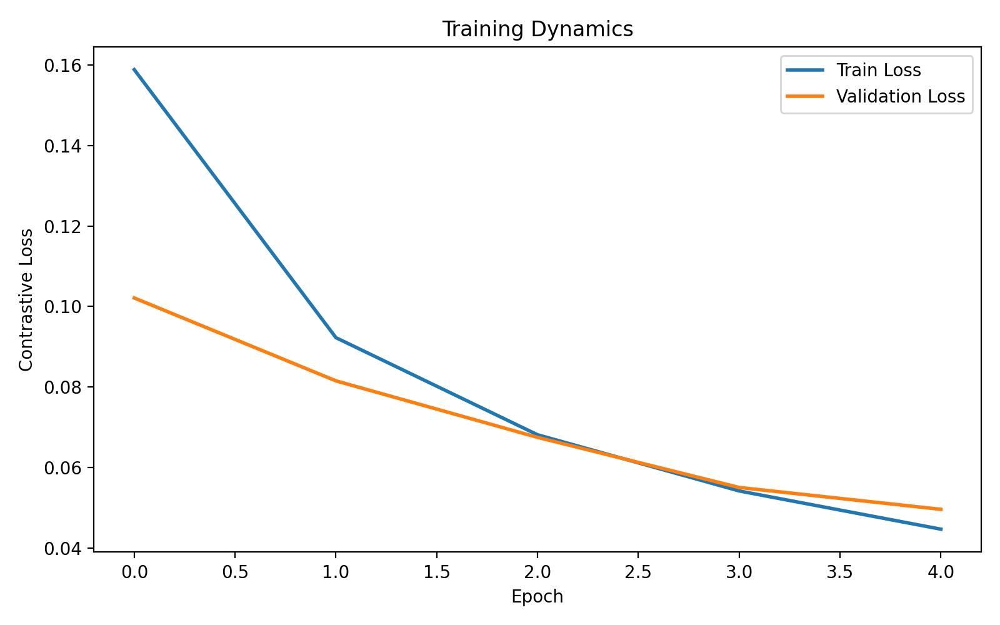

### Sample Pairs

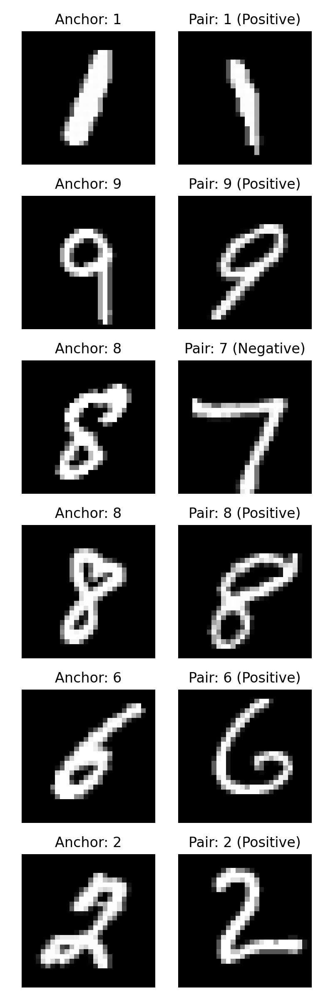

### t-SNE Plot

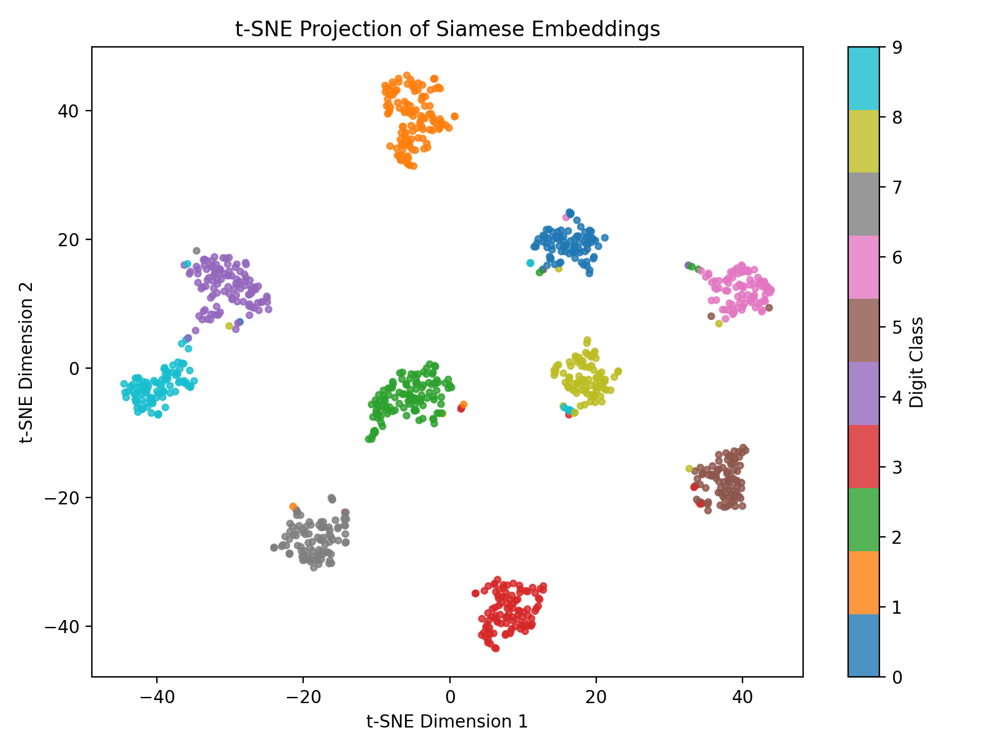

### One-Shot Examples

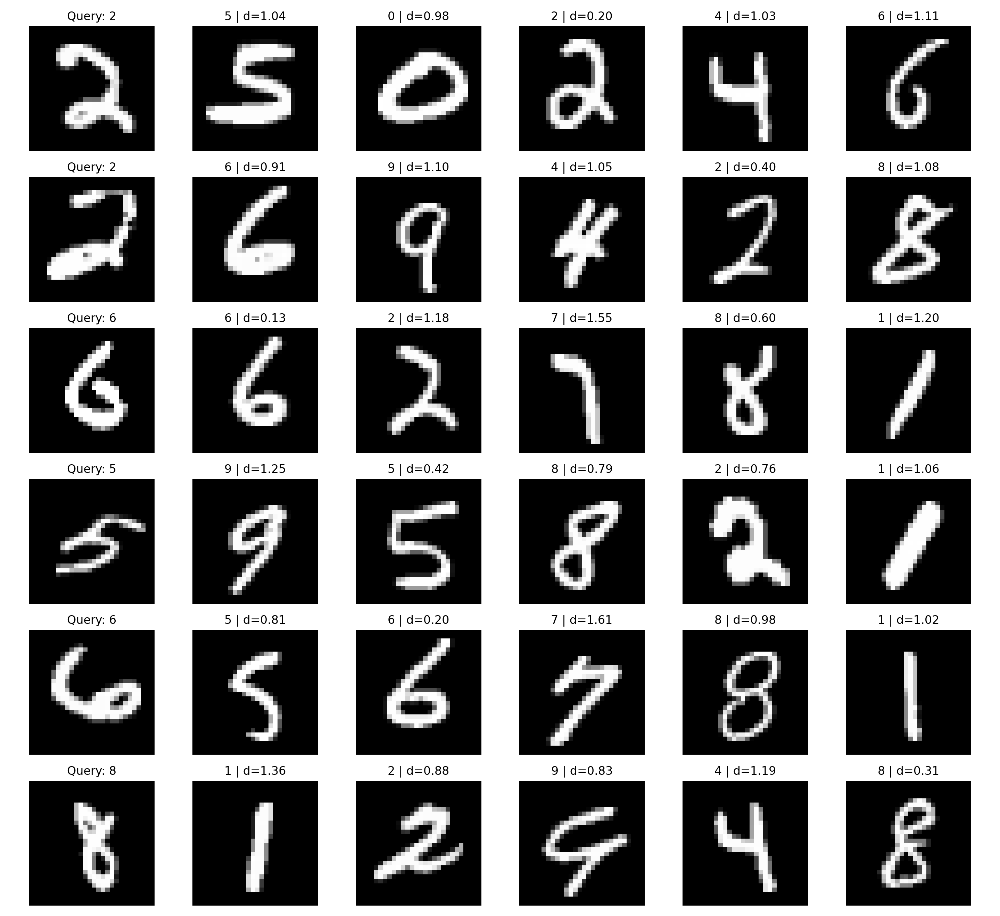

In [5]:
selected_dataset = "mnist"  # choose from: mnist, fashion_mnist, fashion_products_small, amharic_handwritten, ethiopian_textile_local
show_dataset_artifacts(selected_dataset)


## All Datasets Viewer

Run the next cell if you want the full artifact dump for every saved experiment.


# MNIST

## Verified Metrics

,Dataset,Best Epoch,Epochs Run,Batch Size,Train Pairs,Val Pairs,Learning Rate,Embedding Dim,Margin,Final Train Loss,Final Val Loss,Train Pair Acc,Val Pair Acc,One-Shot Acc,Effective N-Way,Trials,Checkpoint Exists
0,MNIST,5,5,64,12000,2000,Not serialized in saved outputs,32,1.0000,0.0447,0.0496,0.9697,0.9505,0.9700,5,200,True


## Results Table CSV

,metric,value
0,Dataset,MNIST
1,Best Validation Loss,0.0496
2,Final Train Pair Accuracy,0.9697
3,Final Validation Pair Accuracy,0.9505
4,One-Shot Accuracy,0.97
5,Embedding Dimension,32
6,Contrastive Margin,1.0


## Failure Summary JSON

,true_label,predicted_label,count
0,9,8,2
1,8,5,1
2,0,6,1
3,6,5,1
4,3,0,1


,trial,query_index,true_label,predicted_label,closest_distance
0,62,8325,0,6,0.2158
1,59,7874,9,8,0.3346
2,44,6578,8,5,0.4100
3,13,7874,9,8,0.4119
4,127,7078,6,5,0.7001
5,145,5955,3,0,0.7139


## Failure Analysis CSV

,analysis_type,true_label,predicted_label,count,trial,query_index,closest_distance
0,confusion,9,8,2.0000,NaN,NaN,NaN
1,confusion,8,5,1.0000,NaN,NaN,NaN
2,confusion,0,6,1.0000,NaN,NaN,NaN
3,confusion,6,5,1.0000,NaN,NaN,NaN
4,confusion,3,0,1.0000,NaN,NaN,NaN
5,hardest_failure,0,6,NaN,62.0000,8325.0000,0.2158
6,hardest_failure,9,8,NaN,59.0000,7874.0000,0.3346
7,hardest_failure,8,5,NaN,44.0000,6578.0000,0.4100
8,hardest_failure,9,8,NaN,13.0000,7874.0000,0.4119
9,hardest_failure,6,5,NaN,127.0000,7078.0000,0.7001


## Generated Report Markdown

# Few-Shot Learning with Siamese Networks Report

## Project Summary

This experiment trains a Siamese Neural Network with contrastive loss on MNIST. The model learns an embedding space where same-class images stay close together while different-class images are pushed apart. The learned embedding is then evaluated through one-shot recognition rather than conventional closed-set classification.

## Experimental Setup

- Dataset: MNIST
- Epochs run: 5
- Batch size: 64
- Train pairs per epoch: 12000
- Validation pairs: 2000
- Embedding dimension: 32
- Contrastive margin: 1.0
- One-shot setting: 5-way, 200 trials

## Quantitative Results

- Best validation loss: 0.0496
- Final train pair accuracy: 0.9697
- Final validation pair accuracy: 0.9505
- One-shot accuracy: 0.9700

## Learning Dynamics

The training curve is saved in `report_assets/loss_curve_mnist.png`. A healthy run should show decreasing training loss together with stable or improving validation loss. If validation loss stops improving quickly, that usually indicates either a small model capacity ceiling or that the sampled negative pairs are too easy.

## Embedding Space Analysis

The t-SNE projection saved in `report_assets/tsne_plot_mnist.png` provides a low-dimensional view of the learned embedding space. Effective metric learning should create visible clusters for individual classes, while visually similar classes remain closer to each other. This behavior is expected because t-SNE preserves local neighborhood structure more than global geometry.

## One-Shot Failure Analysis

The model made 6 errors out of 200 one-shot trials.

Most common confusion patterns:
- 9 -> 8: 2 cases
- 8 -> 5: 1 cases
- 0 -> 6: 1 cases
- 6 -> 5: 1 cases
- 3 -> 0: 1 cases

Hardest failure cases are saved in `outputs/results/one_shot_failure_analysis_mnist.csv`.

## Discussion

Few-shot learning is useful when annotated data is limited, expensive, or constantly changing. Instead of learning only a fixed classifier boundary, the Siamese network learns a reusable similarity function. That is especially useful for verification, retrieval, anomaly matching, and low-resource recognition tasks.

For this project, MNIST offers a fast and controlled benchmark. MNIST-style datasets let the model converge quickly on CPU, which makes them practical for university coursework and rapid experimentation. The main limitation is that these datasets are relatively simple compared with real-world image variation, so they can overestimate how well a method will scale without harder negative mining or stronger feature extractors.

## Reproducibility

Run the full experiment with:

```bash
python main.py --dataset mnist
```

Launch the frontend with:

```bash
streamlit run app.py
```


### Loss Curve

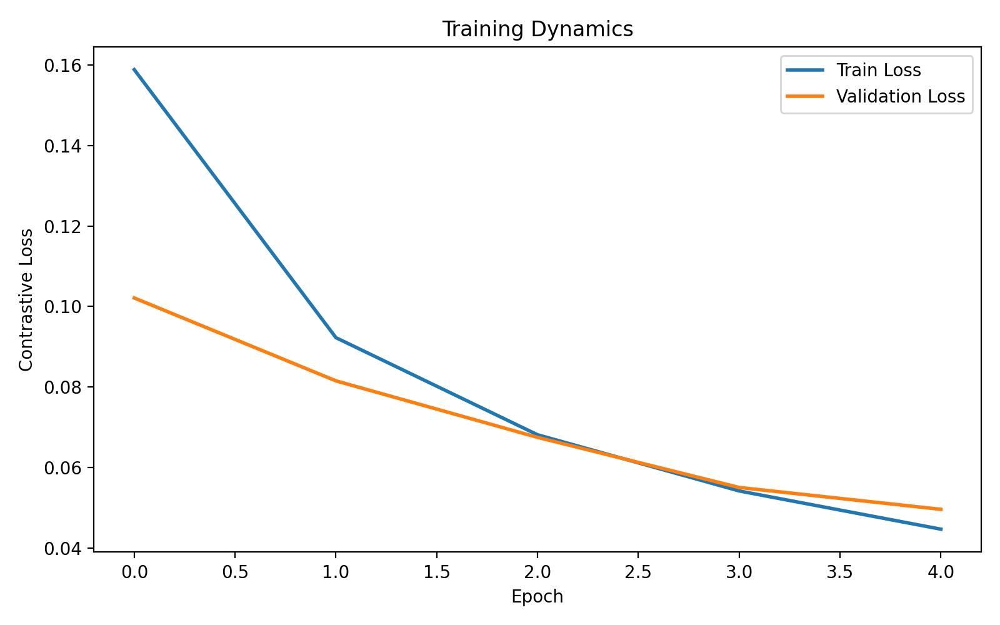

### Sample Pairs

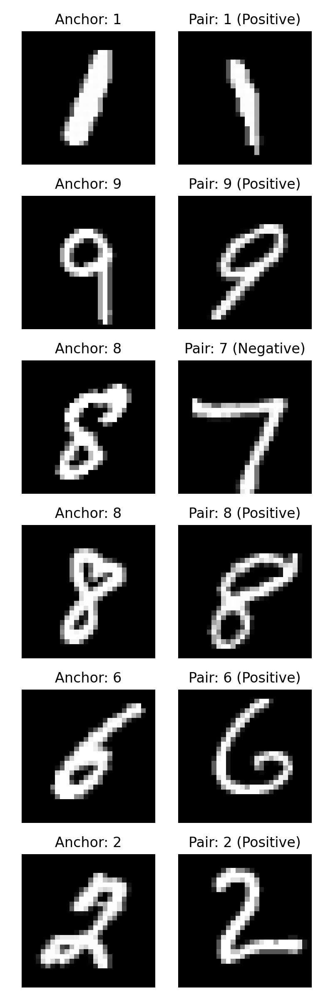

### t-SNE Plot

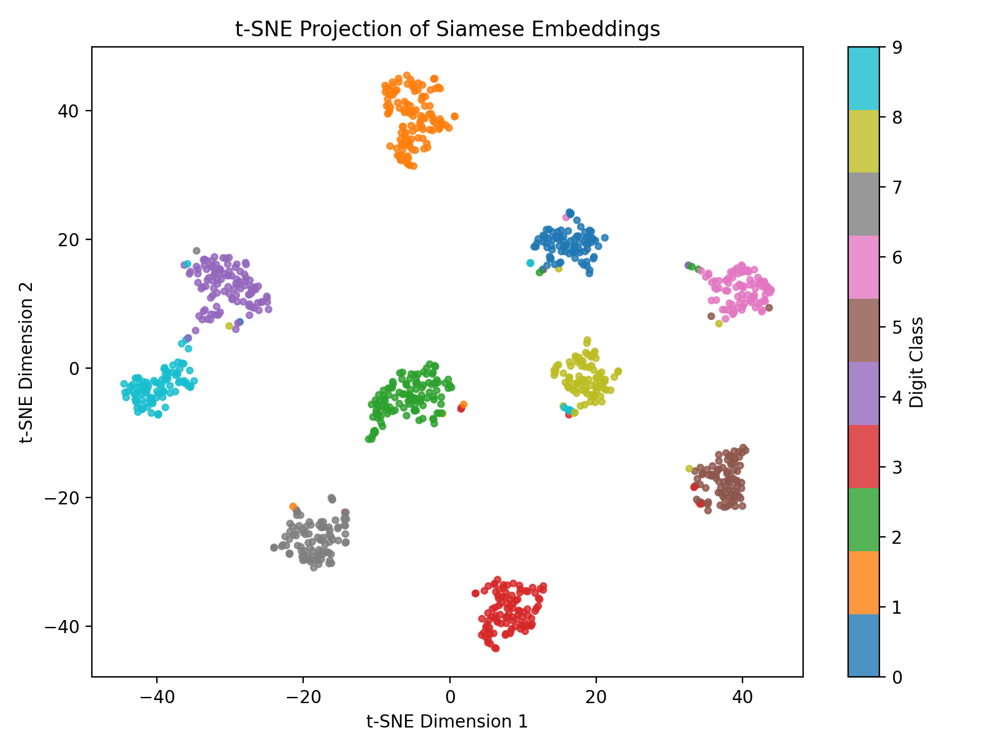

### One-Shot Examples

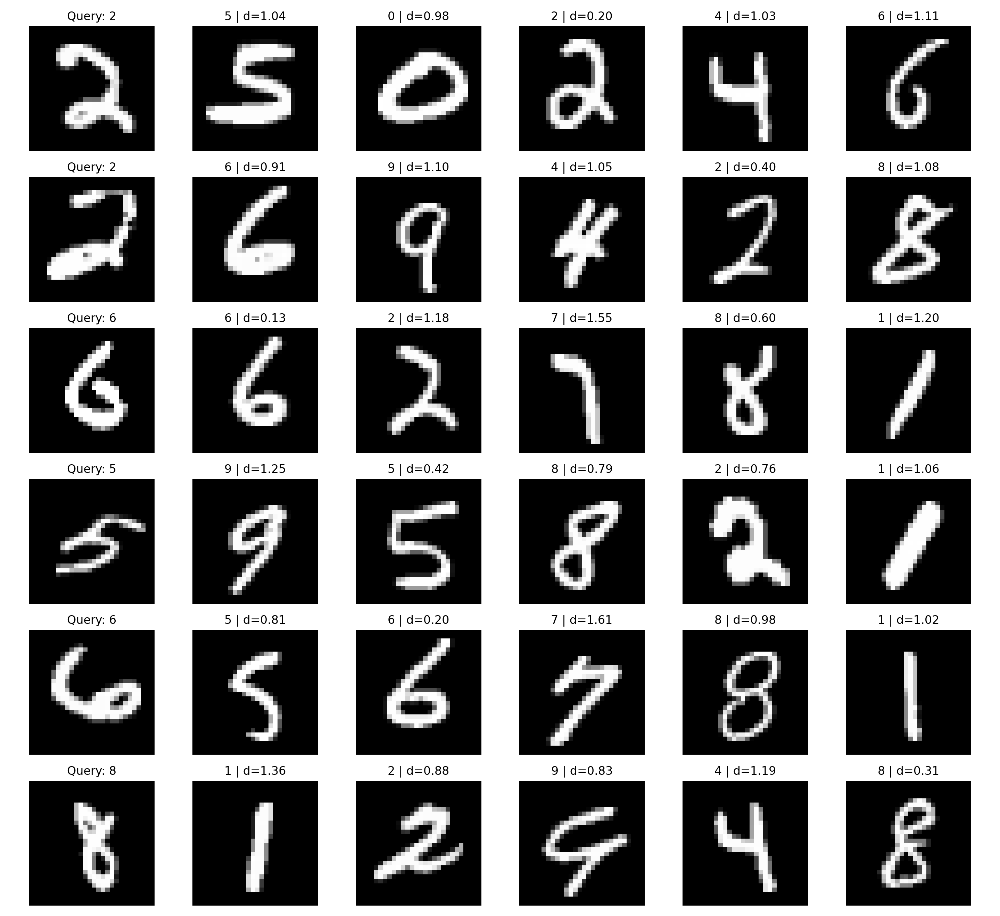

# Fashion-MNIST

## Verified Metrics

,Dataset,Best Epoch,Epochs Run,Batch Size,Train Pairs,Val Pairs,Learning Rate,Embedding Dim,Margin,Final Train Loss,Final Val Loss,Train Pair Acc,Val Pair Acc,One-Shot Acc,Effective N-Way,Trials,Checkpoint Exists
0,Fashion-MNIST,1,1,64,1200,240,Not serialized in saved outputs,32,1.0000,0.2419,0.2280,0.6267,0.6167,0.6500,5,20,True


## Results Table CSV

,metric,value
0,Dataset,Fashion-MNIST
1,Best Validation Loss,0.228
2,Final Train Pair Accuracy,0.6267
3,Final Validation Pair Accuracy,0.6167
4,One-Shot Accuracy,0.65
5,Embedding Dimension,32
6,Contrastive Margin,1.0


## Failure Summary JSON

,true_label,predicted_label,count
0,Trouser,Dress,2
1,Pullover,Shirt,1
2,Dress,Trouser,1
3,Dress,Shirt,1
4,Ankle boot,Sneaker,1
5,Coat,Pullover,1


,trial,query_index,true_label,predicted_label,closest_distance
0,16,3685,Ankle boot,Sneaker,0.1150
1,0,836,Pullover,Shirt,0.1196
2,11,7140,Dress,Trouser,0.1356
3,6,8529,Trouser,Dress,0.1801
4,14,2695,Dress,Shirt,0.2641
5,18,8503,Trouser,Dress,0.2736
6,17,1911,Coat,Pullover,0.2779


## Failure Analysis CSV

,analysis_type,true_label,predicted_label,count,trial,query_index,closest_distance
0,confusion,Trouser,Dress,2.0000,NaN,NaN,NaN
1,confusion,Pullover,Shirt,1.0000,NaN,NaN,NaN
2,confusion,Dress,Trouser,1.0000,NaN,NaN,NaN
3,confusion,Dress,Shirt,1.0000,NaN,NaN,NaN
4,confusion,Ankle boot,Sneaker,1.0000,NaN,NaN,NaN
5,confusion,Coat,Pullover,1.0000,NaN,NaN,NaN
6,hardest_failure,Ankle boot,Sneaker,NaN,16.0000,3685.0000,0.1150
7,hardest_failure,Pullover,Shirt,NaN,0.0000,836.0000,0.1196
8,hardest_failure,Dress,Trouser,NaN,11.0000,7140.0000,0.1356
9,hardest_failure,Trouser,Dress,NaN,6.0000,8529.0000,0.1801


## Generated Report Markdown

# Few-Shot Learning with Siamese Networks Report

## Project Summary

This experiment trains a Siamese Neural Network with contrastive loss on Fashion-MNIST. The model learns an embedding space where same-class images stay close together while different-class images are pushed apart. The learned embedding is then evaluated through one-shot recognition rather than conventional closed-set classification.

## Experimental Setup

- Dataset: Fashion-MNIST
- Epochs run: 1
- Batch size: 64
- Train pairs per epoch: 1200
- Validation pairs: 240
- Embedding dimension: 32
- Contrastive margin: 1.0
- One-shot setting: 5-way, 20 trials

## Quantitative Results

- Best validation loss: 0.2280
- Final train pair accuracy: 0.6267
- Final validation pair accuracy: 0.6167
- One-shot accuracy: 0.6500

## Learning Dynamics

The training curve is saved in `report_assets/loss_curve_fashion_mnist.png`. A healthy run should show decreasing training loss together with stable or improving validation loss. If validation loss stops improving quickly, that usually indicates either a small model capacity ceiling or that the sampled negative pairs are too easy.

## Embedding Space Analysis

The t-SNE projection saved in `report_assets/tsne_plot_fashion_mnist.png` provides a low-dimensional view of the learned embedding space. Effective metric learning should create visible clusters for individual classes, while visually similar classes remain closer to each other. This behavior is expected because t-SNE preserves local neighborhood structure more than global geometry.

## One-Shot Failure Analysis

The model made 7 errors out of 20 one-shot trials.

Most common confusion patterns:
- Trouser -> Dress: 2 cases
- Pullover -> Shirt: 1 cases
- Dress -> Trouser: 1 cases
- Dress -> Shirt: 1 cases
- Ankle boot -> Sneaker: 1 cases

Hardest failure cases are saved in `outputs/results/one_shot_failure_analysis_fashion_mnist.csv`.

## Discussion

Few-shot learning is useful when annotated data is limited, expensive, or constantly changing. Instead of learning only a fixed classifier boundary, the Siamese network learns a reusable similarity function. That is especially useful for verification, retrieval, anomaly matching, and low-resource recognition tasks.

For this project, Fashion-MNIST offers a fast and controlled benchmark. MNIST-style datasets let the model converge quickly on CPU, which makes them practical for university coursework and rapid experimentation. The main limitation is that these datasets are relatively simple compared with real-world image variation, so they can overestimate how well a method will scale without harder negative mining or stronger feature extractors.

## Reproducibility

Run the full experiment with:

```bash
python main.py --dataset fashion_mnist
```

Launch the frontend with:

```bash
streamlit run app.py
```


### Loss Curve

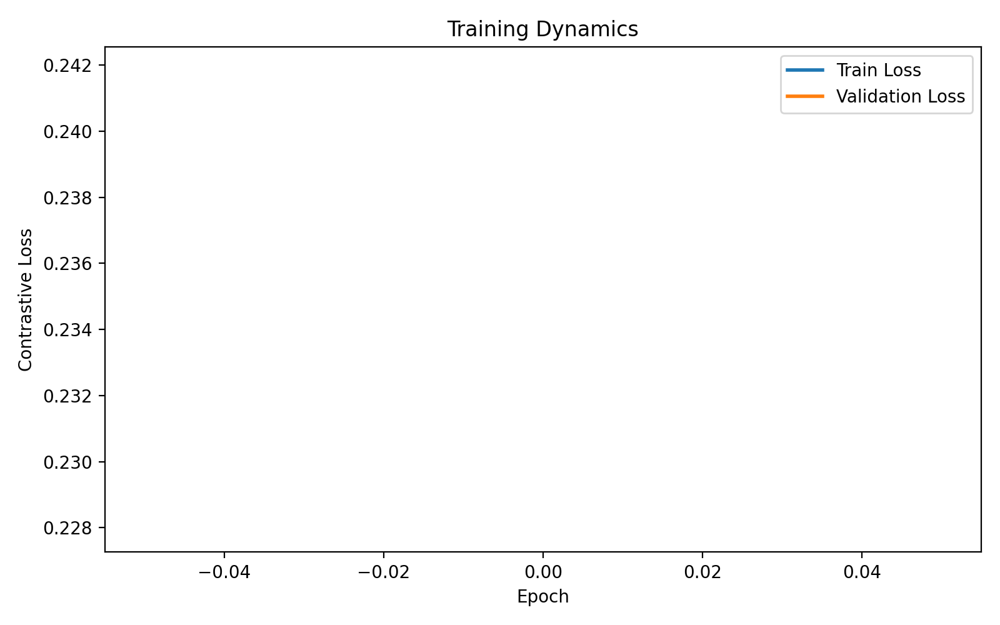

### Sample Pairs

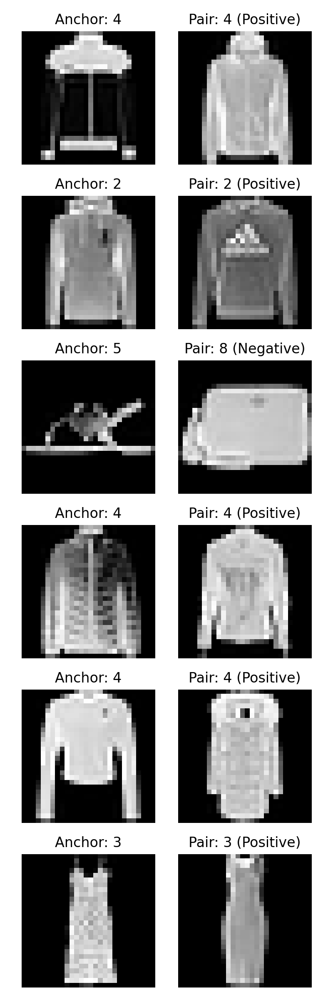

### t-SNE Plot

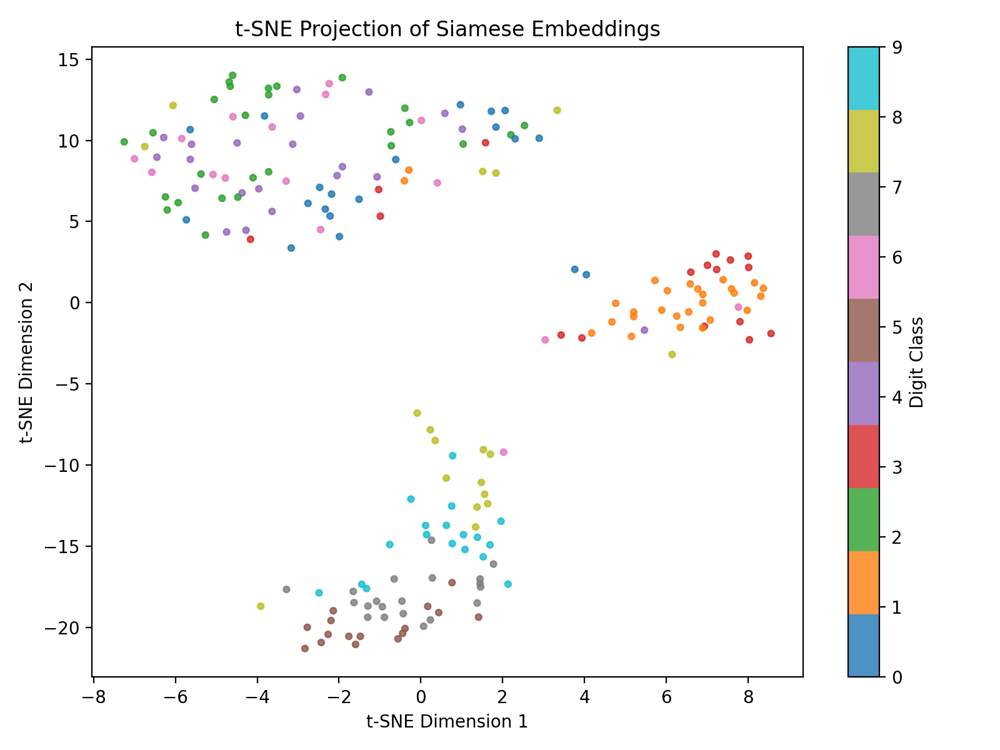

### One-Shot Examples

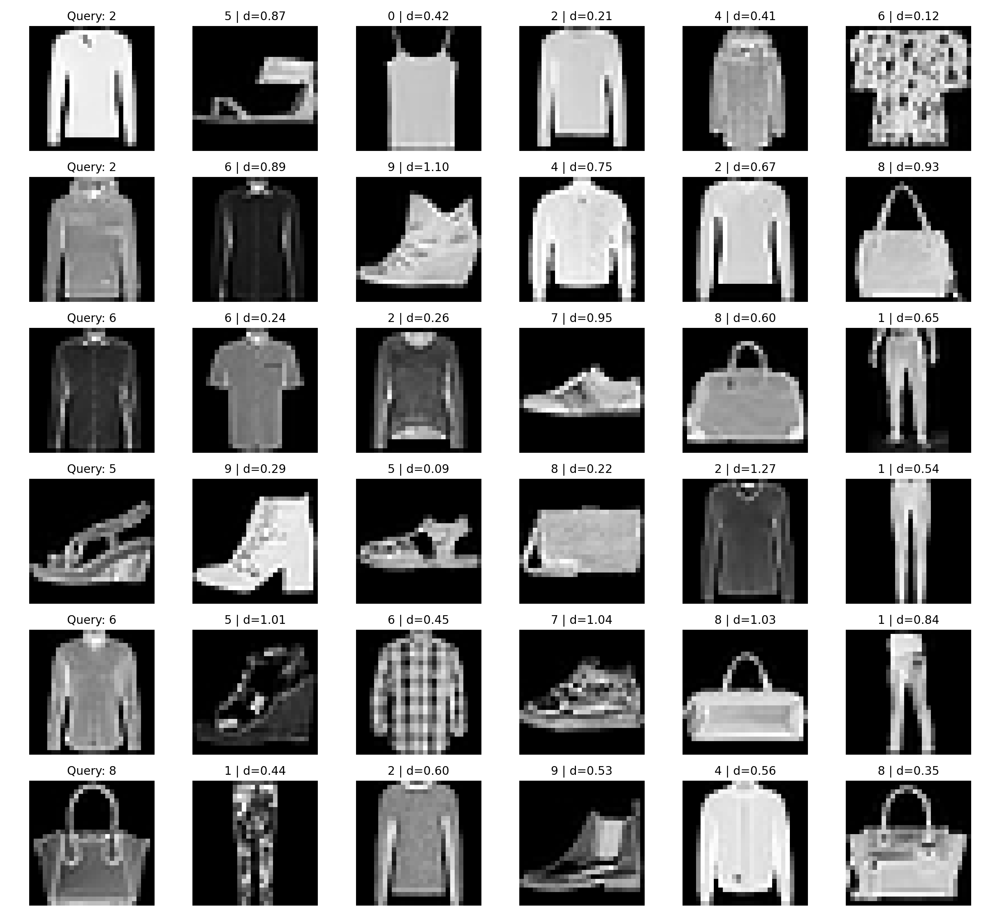

# Fashion Product Images Small

## Verified Metrics

,Dataset,Best Epoch,Epochs Run,Batch Size,Train Pairs,Val Pairs,Learning Rate,Embedding Dim,Margin,Final Train Loss,Final Val Loss,Train Pair Acc,Val Pair Acc,One-Shot Acc,Effective N-Way,Trials,Checkpoint Exists
0,Fashion Product Images Small,5,5,64,12000,2000,Not serialized in saved outputs,32,1.0000,0.1328,0.1242,0.8103,0.8315,0.6900,5,200,True


## Results Table CSV

,metric,value
0,Dataset,Fashion Product Images Small
1,Best Validation Loss,0.1242
2,Final Train Pair Accuracy,0.8103
3,Final Validation Pair Accuracy,0.8315
4,One-Shot Accuracy,0.69
5,Embedding Dimension,32
6,Contrastive Margin,1.0


## Failure Summary JSON

,true_label,predicted_label,count
0,Tops,Shirts,7
1,Jeans,Trousers,7
2,Shorts,Jeans,7
3,Tshirts,Shirts,7
4,Tops,Tshirts,5
5,Trousers,Jeans,4
6,Shirts,Tshirts,3
7,Tops,Kurtas,3
8,Shorts,Trousers,3
9,Trousers,Shorts,3


,trial,query_index,true_label,predicted_label,closest_distance
0,111,2713,Jeans,Trousers,0.0869
1,18,2788,Shirts,Tshirts,0.1045
2,43,1492,Trousers,Jeans,0.1071
3,35,359,Jeans,Trousers,0.1331
4,78,2197,Trousers,Jeans,0.1373
5,0,367,Shirts,Tshirts,0.1379
6,129,2683,Jeans,Trousers,0.1418
7,39,88,Jeans,Trousers,0.1435
8,59,2365,Trousers,Shorts,0.1521
9,125,2872,Jeans,Shorts,0.1587


## Failure Analysis CSV

,analysis_type,true_label,predicted_label,count,trial,query_index,closest_distance
0,confusion,Tops,Shirts,7.0000,NaN,NaN,NaN
1,confusion,Jeans,Trousers,7.0000,NaN,NaN,NaN
2,confusion,Shorts,Jeans,7.0000,NaN,NaN,NaN
3,confusion,Tshirts,Shirts,7.0000,NaN,NaN,NaN
4,confusion,Tops,Tshirts,5.0000,NaN,NaN,NaN
5,confusion,Trousers,Jeans,4.0000,NaN,NaN,NaN
6,confusion,Shirts,Tshirts,3.0000,NaN,NaN,NaN
7,confusion,Tops,Kurtas,3.0000,NaN,NaN,NaN
8,confusion,Shorts,Trousers,3.0000,NaN,NaN,NaN
9,confusion,Trousers,Shorts,3.0000,NaN,NaN,NaN


## Generated Report Markdown

# Few-Shot Learning with Siamese Networks Report

## Project Summary

This experiment trains a Siamese Neural Network with contrastive loss on Fashion Product Images Small. The model learns an embedding space where same-class images stay close together while different-class images are pushed apart. The learned embedding is then evaluated through one-shot recognition rather than conventional closed-set classification.

## Experimental Setup

- Dataset: Fashion Product Images Small
- Epochs run: 5
- Batch size: 64
- Train pairs per epoch: 12000
- Validation pairs: 2000
- Embedding dimension: 32
- Contrastive margin: 1.0
- One-shot setting: 5-way, 200 trials

## Quantitative Results

- Best validation loss: 0.1242
- Final train pair accuracy: 0.8103
- Final validation pair accuracy: 0.8315
- One-shot accuracy: 0.6900

## Learning Dynamics

The training curve is saved in `report_assets/loss_curve_fashion_products_small.png`. A healthy run should show decreasing training loss together with stable or improving validation loss. If validation loss stops improving quickly, that usually indicates either a small model capacity ceiling or that the sampled negative pairs are too easy.

## Embedding Space Analysis

The t-SNE projection saved in `report_assets/tsne_plot_fashion_products_small.png` provides a low-dimensional view of the learned embedding space. Effective metric learning should create visible clusters for individual classes, while visually similar classes remain closer to each other. This behavior is expected because t-SNE preserves local neighborhood structure more than global geometry.

## One-Shot Failure Analysis

The model made 62 errors out of 200 one-shot trials.

Most common confusion patterns:
- Tops -> Shirts: 7 cases
- Jeans -> Trousers: 7 cases
- Shorts -> Jeans: 7 cases
- Tshirts -> Shirts: 7 cases
- Tops -> Tshirts: 5 cases

Hardest failure cases are saved in `outputs/results/one_shot_failure_analysis_fashion_products_small.csv`.

## Discussion

Few-shot learning is useful when annotated data is limited, expensive, or constantly changing. Instead of learning only a fixed classifier boundary, the Siamese network learns a reusable similarity function. That is especially useful for verification, retrieval, anomaly matching, and low-resource recognition tasks.

For this project, Fashion Product Images Small offers a fast and controlled benchmark. MNIST-style datasets let the model converge quickly on CPU, which makes them practical for university coursework and rapid experimentation. The main limitation is that these datasets are relatively simple compared with real-world image variation, so they can overestimate how well a method will scale without harder negative mining or stronger feature extractors.

## Reproducibility

Run the full experiment with:

```bash
python main.py --dataset fashion_products_small
```

Launch the frontend with:

```bash
streamlit run app.py
```


### Loss Curve

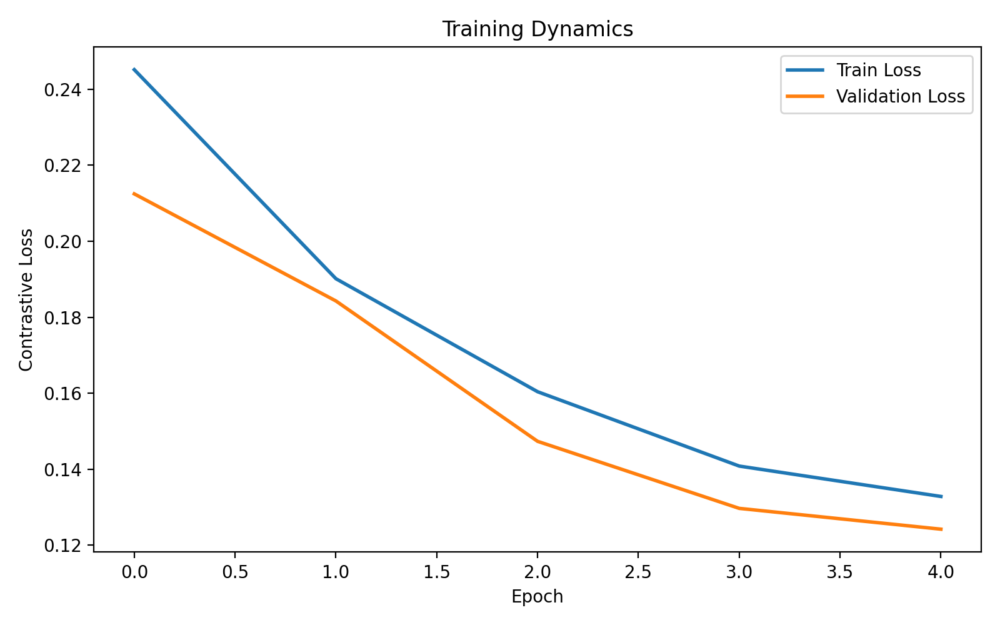

### Sample Pairs

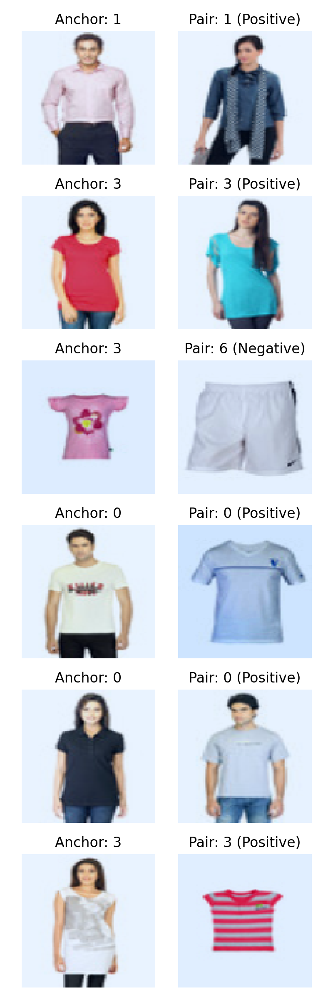

### t-SNE Plot

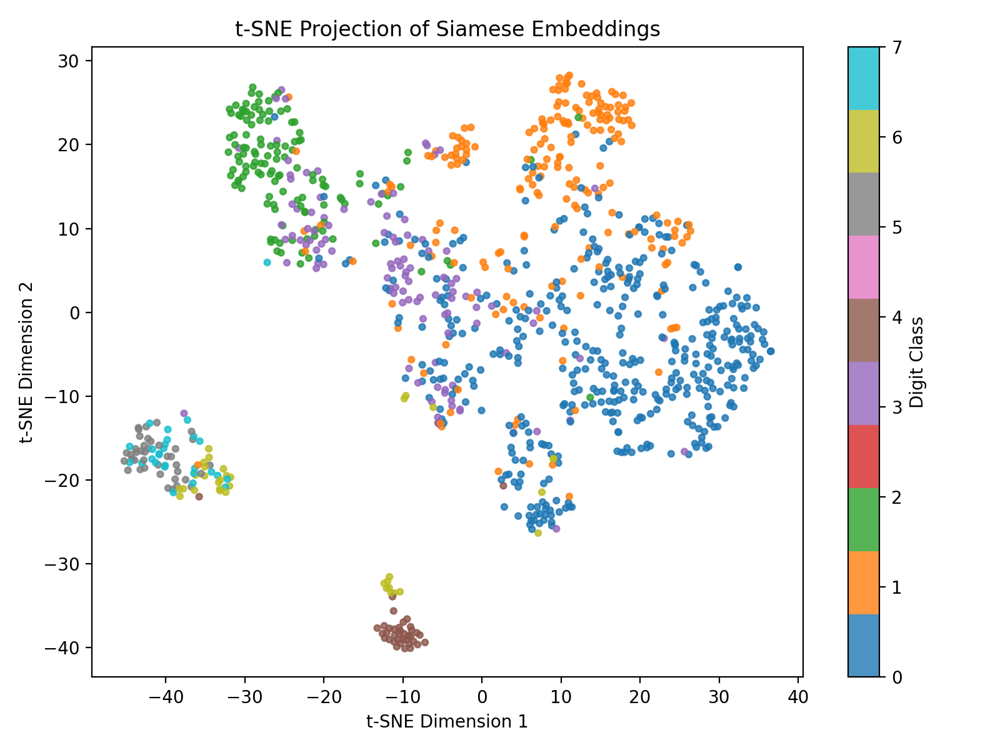

### One-Shot Examples

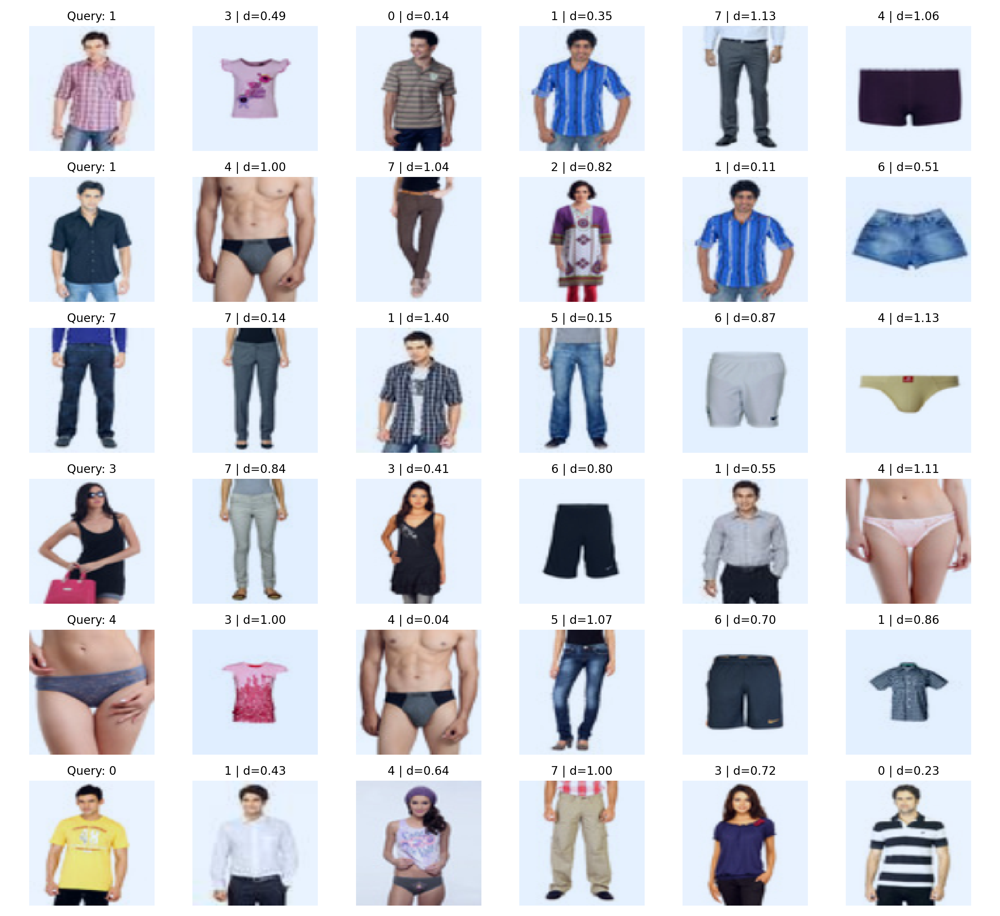

# Amharic Handwritten Characters

## Verified Metrics

,Dataset,Best Epoch,Epochs Run,Batch Size,Train Pairs,Val Pairs,Learning Rate,Embedding Dim,Margin,Final Train Loss,Final Val Loss,Train Pair Acc,Val Pair Acc,One-Shot Acc,Effective N-Way,Trials,Checkpoint Exists
0,Amharic Handwritten Characters,5,5,64,12000,2000,Not serialized in saved outputs,32,1.0000,0.1643,0.1801,0.7623,0.7365,0.5250,5,200,True


## Results Table CSV

,metric,value
0,Dataset,Amharic Handwritten Characters
1,Best Validation Loss,0.1801
2,Final Train Pair Accuracy,0.7623
3,Final Validation Pair Accuracy,0.7365
4,One-Shot Accuracy,0.525
5,Embedding Dimension,32
6,Contrastive Margin,1.0


## Failure Summary JSON

,true_label,predicted_label,count
0,114,184,2
1,161,100,1
2,173,61,1
3,153,267,1
4,76,249,1
...,...,...,...
89,159,223,1
90,64,195,1
91,31,255,1
92,171,9,1


,trial,query_index,true_label,predicted_label,closest_distance
0,115,43,105,173,0.0920
1,153,995,278,11,0.1125
2,150,289,15,101,0.1292
3,112,1122,42,107,0.1309
4,108,1160,5,165,0.1310
5,3,305,153,267,0.1430
6,134,709,225,261,0.1439
7,57,956,270,266,0.1459
8,181,920,264,79,0.1650
9,15,1153,48,276,0.1651


## Failure Analysis CSV

,analysis_type,true_label,predicted_label,count,trial,query_index,closest_distance
0,confusion,114,184,2.0000,NaN,NaN,NaN
1,confusion,161,100,1.0000,NaN,NaN,NaN
2,confusion,173,61,1.0000,NaN,NaN,NaN
3,confusion,153,267,1.0000,NaN,NaN,NaN
4,confusion,76,249,1.0000,NaN,NaN,NaN
5,confusion,286,242,1.0000,NaN,NaN,NaN
6,confusion,151,11,1.0000,NaN,NaN,NaN
7,confusion,229,280,1.0000,NaN,NaN,NaN
8,confusion,48,276,1.0000,NaN,NaN,NaN
9,confusion,174,191,1.0000,NaN,NaN,NaN


## Generated Report Markdown

# Few-Shot Learning with Siamese Networks Report

## Project Summary

This experiment trains a Siamese Neural Network with contrastive loss on Amharic Handwritten Characters. The model learns an embedding space where same-class images stay close together while different-class images are pushed apart. The learned embedding is then evaluated through one-shot recognition rather than conventional closed-set classification.

## Experimental Setup

- Dataset: Amharic Handwritten Characters
- Epochs run: 5
- Batch size: 64
- Train pairs per epoch: 12000
- Validation pairs: 2000
- Embedding dimension: 32
- Contrastive margin: 1.0
- One-shot setting: 5-way, 200 trials

## Quantitative Results

- Best validation loss: 0.1801
- Final train pair accuracy: 0.7623
- Final validation pair accuracy: 0.7365
- One-shot accuracy: 0.5250

## Learning Dynamics

The training curve is saved in `report_assets/loss_curve_amharic_handwritten.png`. A healthy run should show decreasing training loss together with stable or improving validation loss. If validation loss stops improving quickly, that usually indicates either a small model capacity ceiling or that the sampled negative pairs are too easy.

## Embedding Space Analysis

The t-SNE projection saved in `report_assets/tsne_plot_amharic_handwritten.png` provides a low-dimensional view of the learned embedding space. Effective metric learning should create visible clusters for individual classes, while visually similar classes remain closer to each other. This behavior is expected because t-SNE preserves local neighborhood structure more than global geometry.

## One-Shot Failure Analysis

The model made 95 errors out of 200 one-shot trials.

Most common confusion patterns:
- 114 -> 184: 2 cases
- 161 -> 100: 1 cases
- 173 -> 61: 1 cases
- 153 -> 267: 1 cases
- 76 -> 249: 1 cases

Hardest failure cases are saved in `outputs/results/one_shot_failure_analysis_amharic_handwritten.csv`.

## Discussion

Few-shot learning is useful when annotated data is limited, expensive, or constantly changing. Instead of learning only a fixed classifier boundary, the Siamese network learns a reusable similarity function. That is especially useful for verification, retrieval, anomaly matching, and low-resource recognition tasks.

For this project, Amharic Handwritten Characters offers a fast and controlled benchmark. MNIST-style datasets let the model converge quickly on CPU, which makes them practical for university coursework and rapid experimentation. The main limitation is that these datasets are relatively simple compared with real-world image variation, so they can overestimate how well a method will scale without harder negative mining or stronger feature extractors.

## Reproducibility

Run the full experiment with:

```bash
python main.py --dataset amharic_handwritten
```

Launch the frontend with:

```bash
streamlit run app.py
```


### Loss Curve

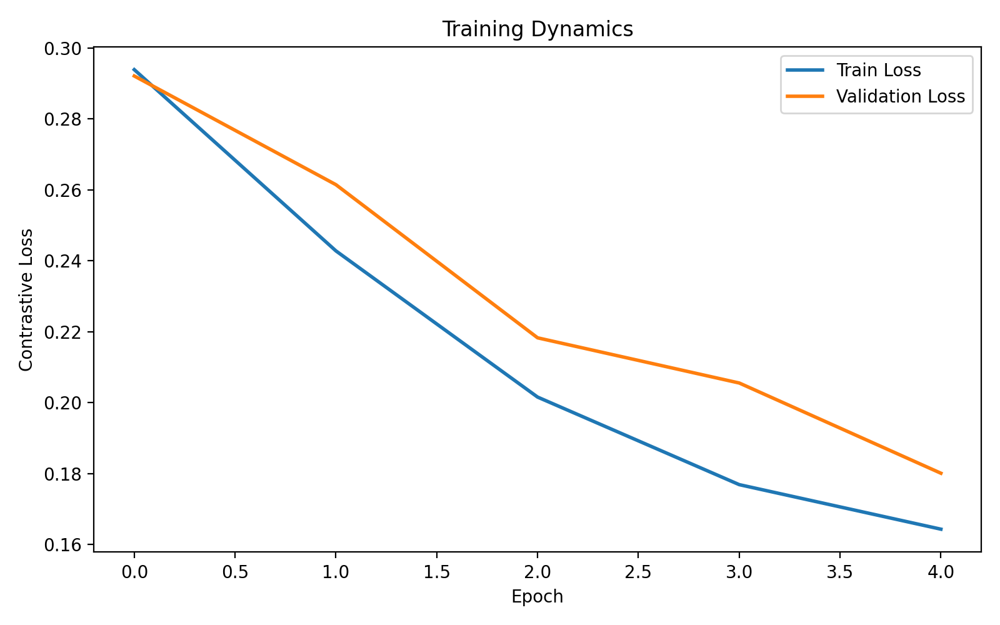

### Sample Pairs

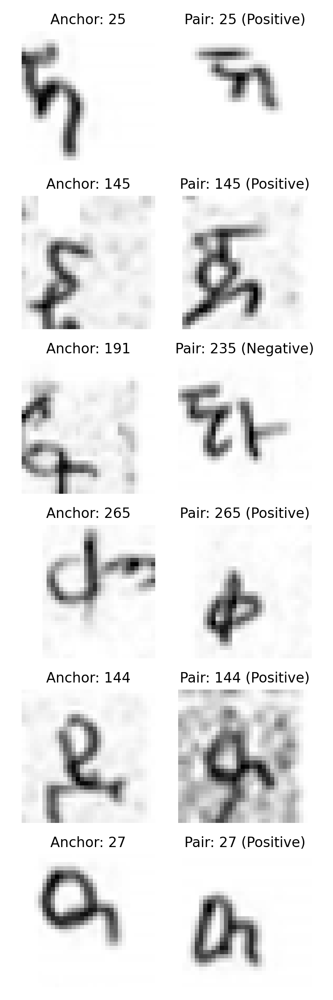

### t-SNE Plot

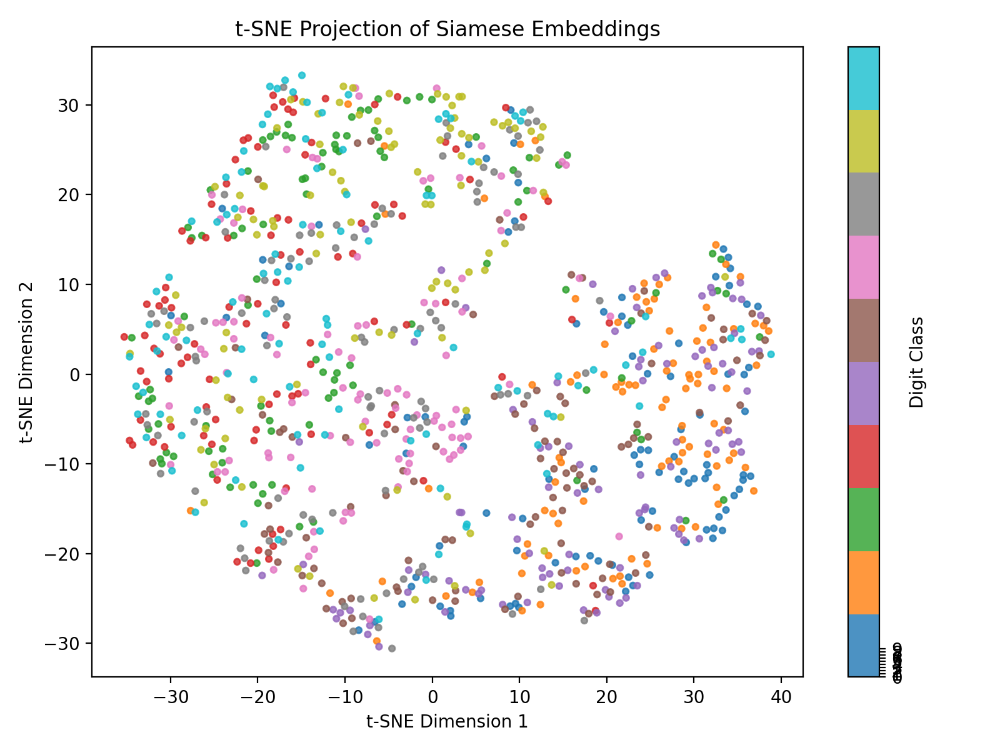

### One-Shot Examples

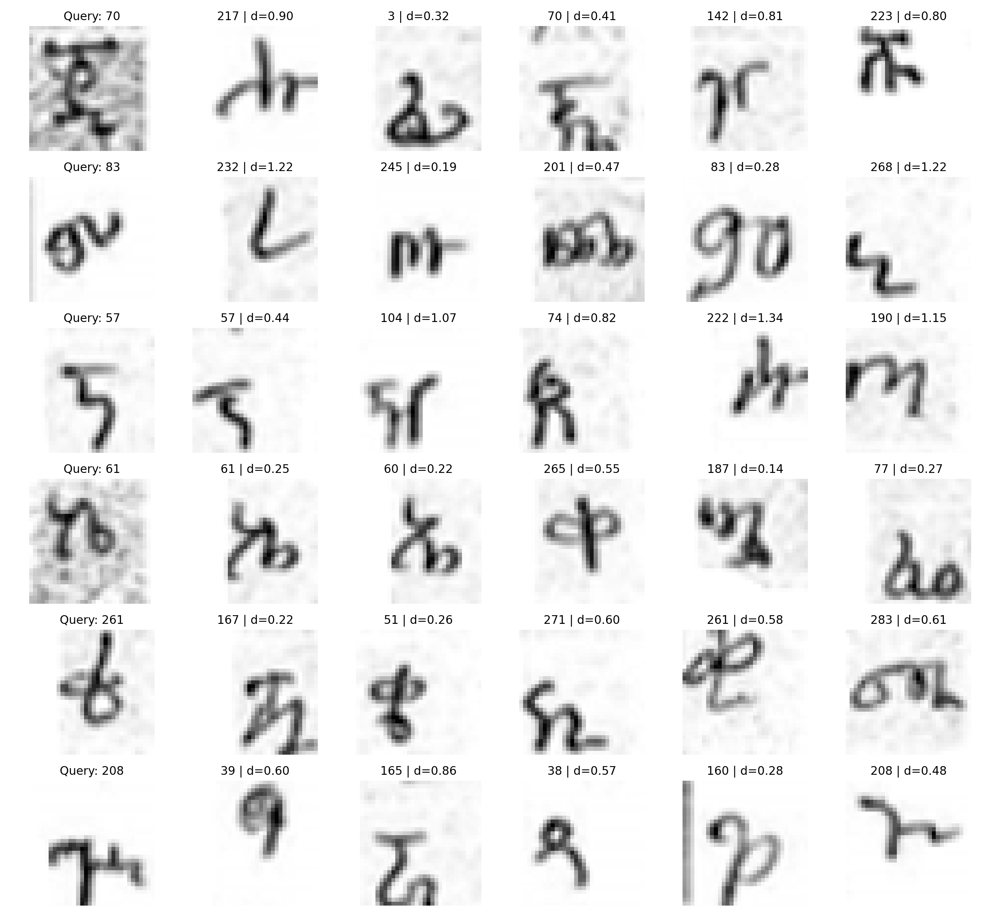

# Ethiopian Cultural Clothing and Textile

## Verified Metrics

,Dataset,Best Epoch,Epochs Run,Batch Size,Train Pairs,Val Pairs,Learning Rate,Embedding Dim,Margin,Final Train Loss,Final Val Loss,Train Pair Acc,Val Pair Acc,One-Shot Acc,Effective N-Way,Trials,Checkpoint Exists
0,Ethiopian Cultural Clothing and Textile,1,1,2,12,6,Not serialized in saved outputs,32,1.0000,0.2320,0.0029,0.6667,1.0000,1.0000,2,6,True


## Results Table CSV

,metric,value
0,Dataset,Ethiopian Cultural Clothing and Textile
1,Best Validation Loss,0.0029
2,Final Train Pair Accuracy,0.6667
3,Final Validation Pair Accuracy,1.0
4,One-Shot Accuracy,1.0
5,Embedding Dimension,32
6,Contrastive Margin,1.0


## Failure Summary JSON

,note
0,No recorded confusions


,note
0,No recorded hardest failures


## Failure Analysis CSV

,note
0,No failure CSV for this dataset


## Generated Report Markdown

# Few-Shot Learning with Siamese Networks Report

## Project Summary

This experiment trains a Siamese Neural Network with contrastive loss on Ethiopian Cultural Clothing and Textile. The model learns an embedding space where same-class images stay close together while different-class images are pushed apart. The learned embedding is then evaluated through one-shot recognition rather than conventional closed-set classification.

## Experimental Setup

- Dataset: Ethiopian Cultural Clothing and Textile
- Epochs run: 1
- Batch size: 2
- Train pairs per epoch: 12
- Validation pairs: 6
- Embedding dimension: 32
- Contrastive margin: 1.0
- One-shot setting: 5-way, 6 trials

## Quantitative Results

- Best validation loss: 0.0029
- Final train pair accuracy: 0.6667
- Final validation pair accuracy: 1.0000
- One-shot accuracy: 1.0000

## Learning Dynamics

The training curve is saved in `report_assets/loss_curve_ethiopian_textile_local.png`. A healthy run should show decreasing training loss together with stable or improving validation loss. If validation loss stops improving quickly, that usually indicates either a small model capacity ceiling or that the sampled negative pairs are too easy.

## Embedding Space Analysis

The t-SNE projection saved in `report_assets/tsne_plot_ethiopian_textile_local.png` provides a low-dimensional view of the learned embedding space. Effective metric learning should create visible clusters for individual classes, while visually similar classes remain closer to each other. This behavior is expected because t-SNE preserves local neighborhood structure more than global geometry.

## One-Shot Failure Analysis

The model made 0 errors out of 6 one-shot trials.

Most common confusion patterns:
- No one-shot failures were recorded in the current run.

Hardest failure cases are saved in `outputs/results/one_shot_failure_analysis_ethiopian_textile_local.csv`.

## Discussion

Few-shot learning is useful when annotated data is limited, expensive, or constantly changing. Instead of learning only a fixed classifier boundary, the Siamese network learns a reusable similarity function. That is especially useful for verification, retrieval, anomaly matching, and low-resource recognition tasks.

For this project, Ethiopian Cultural Clothing and Textile offers a fast and controlled benchmark. MNIST-style datasets let the model converge quickly on CPU, which makes them practical for university coursework and rapid experimentation. The main limitation is that these datasets are relatively simple compared with real-world image variation, so they can overestimate how well a method will scale without harder negative mining or stronger feature extractors.

## Reproducibility

Run the full experiment with:

```bash
python main.py --dataset ethiopian_textile_local
```

Launch the frontend with:

```bash
streamlit run app.py
```


### Loss Curve

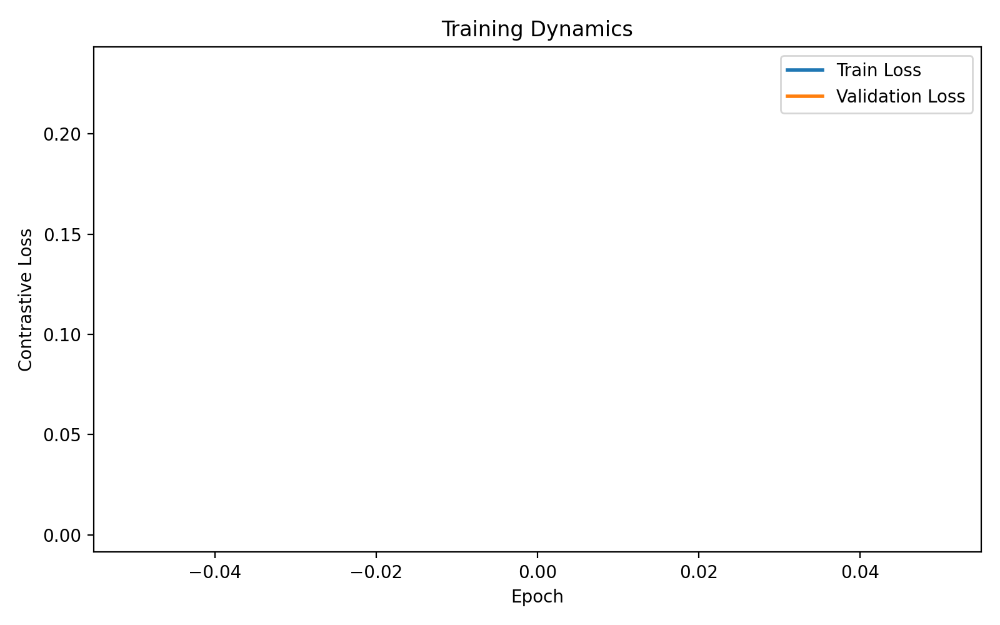

### Sample Pairs

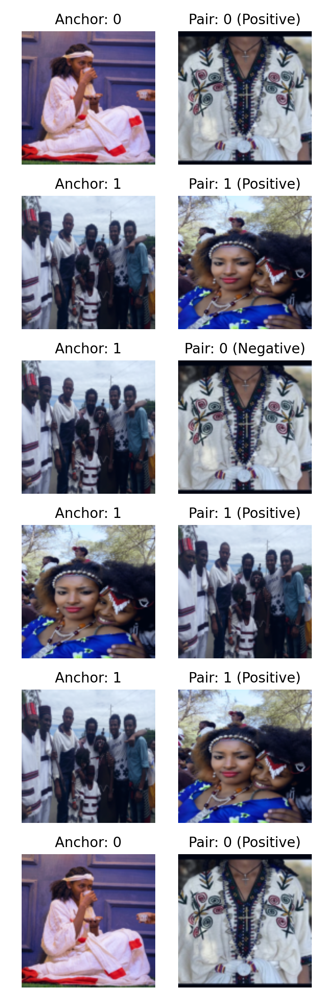

### t-SNE Plot

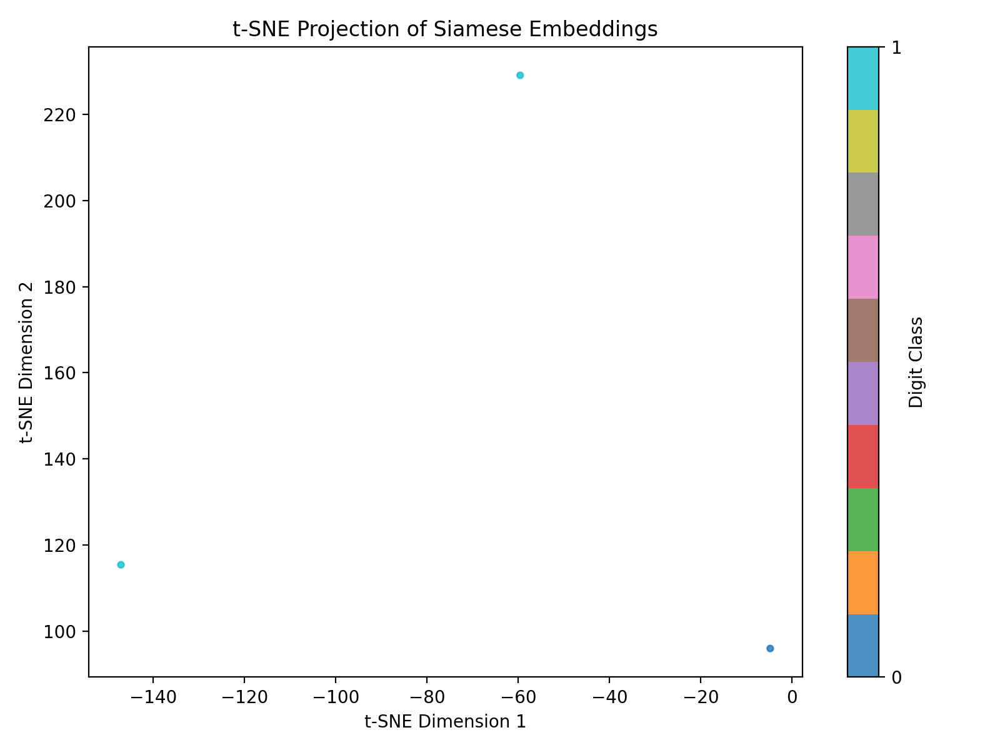

### One-Shot Examples

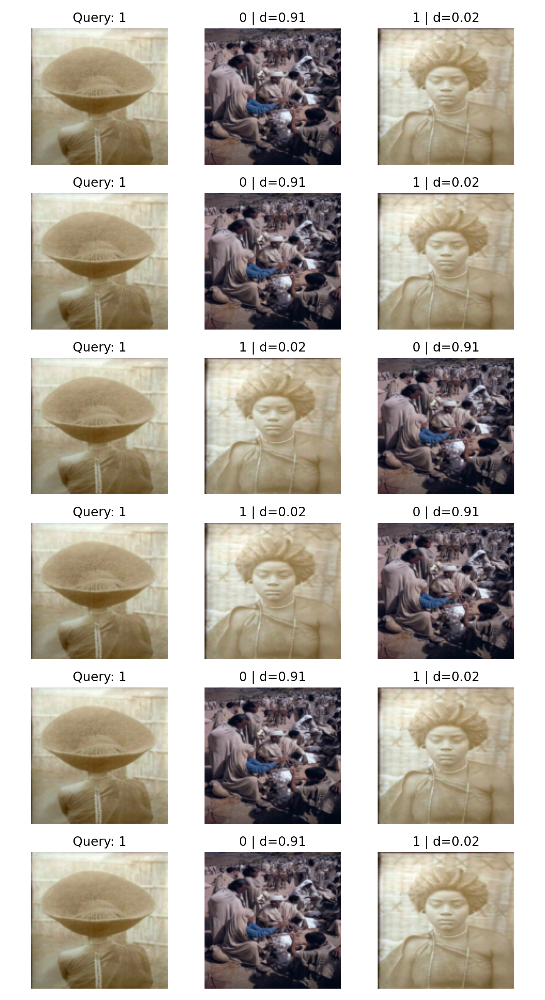

In [6]:
for dataset in DATASETS:
    show_dataset_artifacts(dataset)


## Source File Viewer

Use this to inspect the implementation directly from the notebook.


In [7]:
display(pd.DataFrame({"Available Source Files": SOURCE_FILES}))
selected_source = "model.py"  # change this value as needed
show_source(selected_source)

display(Markdown("## All Core Source Files"))
for filename in SOURCE_FILES:
    show_source(filename)


,Available Source Files
0,config.py
1,dataset.py
2,model.py
3,loss.py
4,train.py
5,evaluate.py
6,pipeline.py
7,report.py
8,app.py
9,main.py


## Source: `model.py`

```python
import torch
import torch.nn as nn
import torch.nn.functional as F


class EmbeddingNetwork(nn.Module):
    def __init__(self, embedding_dim: int = 32, input_channels: int = 1) -> None:
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(input_channels, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1)),
        )
        self.projection = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128, 64),
            nn.ReLU(inplace=True),
            nn.Linear(64, embedding_dim),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        embedding = self.projection(self.features(x))
        return F.normalize(embedding, p=2, dim=1)


class SiameseNetwork(nn.Module):
    def __init__(self, embedding_dim: int = 32, input_channels: int = 1) -> None:
        super().__init__()
        self.encoder = EmbeddingNetwork(embedding_dim=embedding_dim, input_channels=input_channels)

    def forward_once(self, x: torch.Tensor) -> torch.Tensor:
        return self.encoder(x)

    def forward(self, left: torch.Tensor, right: torch.Tensor):
        left_embedding = self.forward_once(left)
        right_embedding = self.forward_once(right)
        return left_embedding, right_embedding

```

## All Core Source Files

## Source: `config.py`

```python
from dataclasses import dataclass, field
from pathlib import Path
from typing import List, Tuple


SUPPORTED_DATASETS = (
    "mnist",
    "fashion_mnist",
    "fashion_products_small",
    "amharic_handwritten",
    "ethiopian_textile_local",
)

DATASET_LABELS = {
    "mnist": "MNIST",
    "fashion_mnist": "Fashion-MNIST",
    "fashion_products_small": "Fashion Product Images Small",
    "amharic_handwritten": "Amharic Handwritten Characters",
    "ethiopian_textile_local": "Ethiopian Cultural Clothing and Textile",
}


@dataclass
class Config:
    project_root: Path = field(default_factory=lambda: Path(__file__).resolve().parent)
    data_dir: Path = field(init=False)
    outputs_dir: Path = field(init=False)
    figures_dir: Path = field(init=False)
    models_dir: Path = field(init=False)
    results_dir: Path = field(init=False)
    report_assets_dir: Path = field(init=False)

    seed: int = 42
    dataset_name: str = "mnist"
    image_size: Tuple[int, int] = (28, 28)
    input_channels: int = 1
    batch_size: int = 64
    num_workers: int = 0
    train_pairs_per_epoch: int = 12000
    val_pairs: int = 2000
    embedding_dim: int = 32
    learning_rate: float = 1e-3
    weight_decay: float = 1e-4
    epochs: int = 5
    margin: float = 1.0
    early_stopping_patience: int = 3
    one_shot_trials: int = 200
    one_shot_way: int = 5
    tsne_samples: int = 1000
    log_interval: int = 50
    model_name: str = field(init=False)
    history_name: str = field(init=False)
    metrics_name: str = field(init=False)
    results_table_name: str = field(init=False)
    sample_pairs_name: str = field(init=False)
    loss_curve_name: str = field(init=False)
    tsne_name: str = field(init=False)
    one_shot_examples_name: str = field(init=False)
    failures_name: str = field(init=False)
    report_name: str = field(init=False)

    def __post_init__(self) -> None:
        self.dataset_name = self.dataset_name.lower().replace("-", "_")
        if self.dataset_name not in SUPPORTED_DATASETS:
            supported = ", ".join(SUPPORTED_DATASETS)
            raise ValueError(f"Unsupported dataset '{self.dataset_name}'. Choose from: {supported}.")
        self.data_dir = self.project_root / "data"
        self.outputs_dir = self.project_root / "outputs"
        self.figures_dir = self.outputs_dir / "figures"
        self.models_dir = self.outputs_dir / "models"
        self.results_dir = self.outputs_dir / "results"
        self.report_assets_dir = self.project_root / "report_assets"
        if self.dataset_name == "fashion_mnist":
            self.image_size = (28, 28)
            self.input_channels = 1
        elif self.dataset_name == "amharic_handwritten":
            self.image_size = (32, 32)
            self.input_channels = 1
        elif self.dataset_name == "fashion_products_small":
            self.image_size = (96, 96)
            self.input_channels = 3
        elif self.dataset_name == "ethiopian_textile_local":
            self.image_size = (128, 128)
            self.input_channels = 3
        suffix = self.dataset_name
        self.model_name = f"siamese_{suffix}.pt"
        self.history_name = f"training_history_{suffix}.json"
        self.metrics_name = f"evaluation_metrics_{suffix}.json"
        self.results_table_name = f"results_table_{suffix}.csv"
        self.sample_pairs_name = f"sample_pairs_{suffix}.png"
        self.loss_curve_name = f"loss_curve_{suffix}.png"
        self.tsne_name = f"tsne_plot_{suffix}.png"
        self.one_shot_examples_name = f"one_shot_examples_{suffix}.png"
        self.failures_name = f"one_shot_failure_analysis_{suffix}.csv"
        self.report_name = f"report_{suffix}.md"

    @property
    def dataset_title(self) -> str:
        return DATASET_LABELS[self.dataset_name]

    @property
    def class_names(self) -> List[str]:
        if self.dataset_name == "fashion_mnist":
            return [
                "T-shirt/top",
                "Trouser",
                "Pullover",
                "Dress",
                "Coat",
                "Sandal",
                "Shirt",
                "Sneaker",
                "Bag",
                "Ankle boot",
            ]
        if self.dataset_name == "amharic_handwritten":
            return [str(index) for index in range(287)]
        if self.dataset_name == "fashion_products_small":
            return []
        if self.dataset_name == "ethiopian_textile_local":
            return []
        return [str(index) for index in range(10)]

    @property
    def normalization_stats(self) -> Tuple[Tuple[float], Tuple[float]]:
        if self.dataset_name == "fashion_mnist":
            return (0.2860,), (0.3530,)
        if self.dataset_name == "amharic_handwritten":
            return (0.5,), (0.5,)
        if self.dataset_name == "fashion_products_small":
            return (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
        if self.dataset_name == "ethiopian_textile_local":
            return (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
        return (0.1307,), (0.3081,)

```

## Source: `dataset.py`

```python
from collections import defaultdict
from dataclasses import dataclass
from pathlib import Path
from typing import Dict, List, Sequence, Tuple

import numpy as np
import torch
from datasets import load_dataset as hf_load_dataset
from huggingface_hub import hf_hub_download
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from torchvision.datasets import ImageFolder
import zipfile


@dataclass
class DatasetBundle:
    train_loader: DataLoader
    val_loader: DataLoader
    train_dataset: "SiamesePairDataset"
    val_dataset: "SiamesePairDataset"
    raw_train: Dataset
    raw_test: Dataset
    class_names: List[str]


class HFDatasetWrapper(Dataset):
    def __init__(self, hf_dataset, transform, label_names: List[str]) -> None:
        self.hf_dataset = hf_dataset
        self.transform = transform
        self.label_names = label_names
        self.targets = np.array([int(item["label"]) for item in hf_dataset], dtype=np.int64)

    def __len__(self) -> int:
        return len(self.hf_dataset)

    def __getitem__(self, index: int):
        item = self.hf_dataset[index]
        image = item["image"].convert("RGB")
        label = int(item["label"])
        if self.transform is not None:
            image = self.transform(image)
        return image, label


class SiamesePairDataset(Dataset):
    def __init__(
        self,
        image_dataset: Dataset,
        pairs_per_epoch: int,
        seed: int,
    ) -> None:
        self.image_dataset = image_dataset
        self.pairs_per_epoch = pairs_per_epoch
        self.seed = seed
        self.targets = np.array(image_dataset.targets)
        self.label_to_indices = self._build_index(self.targets)
        self.labels = sorted(self.label_to_indices.keys())
        self.labels_with_multiple_examples = [
            label for label, indices in self.label_to_indices.items() if len(indices) >= 2
        ]

    @staticmethod
    def _build_index(targets: Sequence[int]) -> Dict[int, np.ndarray]:
        lookup: Dict[int, List[int]] = defaultdict(list)
        for index, label in enumerate(targets):
            lookup[int(label)].append(index)
        return {label: np.array(indices, dtype=np.int64) for label, indices in lookup.items()}

    def __len__(self) -> int:
        return self.pairs_per_epoch

    def __getitem__(self, index: int):
        rng = np.random.default_rng(self.seed + index)
        anchor_index = int(rng.integers(0, len(self.image_dataset)))
        anchor_image, anchor_label = self.image_dataset[anchor_index]

        same_class = bool(rng.integers(0, 2))
        if same_class and len(self.label_to_indices[int(anchor_label)]) >= 2:
            partner_index = anchor_index
            while partner_index == anchor_index:
                partner_index = int(rng.choice(self.label_to_indices[int(anchor_label)]))
            label = 0.0
        else:
            negative_label = int(rng.choice([item for item in self.labels if item != int(anchor_label)]))
            partner_index = int(rng.choice(self.label_to_indices[negative_label]))
            label = 1.0

        partner_image, partner_label = self.image_dataset[partner_index]
        return (
            anchor_image,
            partner_image,
            torch.tensor(label, dtype=torch.float32),
            torch.tensor(anchor_label, dtype=torch.long),
            torch.tensor(partner_label, dtype=torch.long),
        )


def get_transforms(config):
    mean, std = config.normalization_stats
    transform_steps = [transforms.Resize(config.image_size)]
    if config.input_channels == 1:
        transform_steps.append(transforms.Grayscale(num_output_channels=1))
    transform_steps.extend([transforms.ToTensor(), transforms.Normalize(mean, std)])
    return transforms.Compose(transform_steps)


def get_dataset_class(config):
    return datasets.FashionMNIST if config.dataset_name == "fashion_mnist" else datasets.MNIST


def download_and_extract_geez_dataset(config) -> Path:
    target_root = config.data_dir / "amharic_handwritten"
    extract_root = target_root / "OCR_dataset"
    if extract_root.exists():
        return extract_root
    target_root.mkdir(parents=True, exist_ok=True)
    archive_path = hf_hub_download(
        repo_id="Yaredoffice/geez-characters",
        filename="OCR_dataset.zip",
        repo_type="dataset",
        local_dir=target_root,
    )
    with zipfile.ZipFile(archive_path, "r") as archive:
        archive.extractall(target_root)
    return extract_root


def create_amharic_dataset_bundle(config) -> DatasetBundle:
    transform = get_transforms(config)
    dataset_root = download_and_extract_geez_dataset(config)
    raw_train = ImageFolder(root=dataset_root / "train", transform=transform)
    raw_test = ImageFolder(root=dataset_root / "test", transform=transform)
    class_names = list(raw_train.classes)

    train_dataset = SiamesePairDataset(
        image_dataset=raw_train,
        pairs_per_epoch=config.train_pairs_per_epoch,
        seed=config.seed,
    )
    val_dataset = SiamesePairDataset(
        image_dataset=raw_test,
        pairs_per_epoch=config.val_pairs,
        seed=config.seed + 10_000,
    )
    train_loader = DataLoader(
        train_dataset,
        batch_size=config.batch_size,
        shuffle=False,
        num_workers=config.num_workers,
        pin_memory=torch.cuda.is_available(),
    )
    val_loader = DataLoader(
        val_dataset,
        batch_size=config.batch_size,
        shuffle=False,
        num_workers=config.num_workers,
        pin_memory=torch.cuda.is_available(),
    )
    return DatasetBundle(
        train_loader=train_loader,
        val_loader=val_loader,
        train_dataset=train_dataset,
        val_dataset=val_dataset,
        raw_train=raw_train,
        raw_test=raw_test,
        class_names=class_names,
    )


def create_ethiopian_textile_bundle(config) -> DatasetBundle:
    transform = get_transforms(config)
    dataset_root = config.data_dir / "ethiopian_textile_local"
    train_root = dataset_root / "train"
    test_root = dataset_root / "test"
    if not train_root.exists() or not test_root.exists():
        raise FileNotFoundError(
            "Expected a local textile dataset at data/ethiopian_textile_local/train and "
            "data/ethiopian_textile_local/test. See the README for the required folder structure."
        )
    raw_train = ImageFolder(root=train_root, transform=transform)
    raw_test = ImageFolder(root=test_root, transform=transform)
    class_names = list(raw_train.classes)

    train_dataset = SiamesePairDataset(
        image_dataset=raw_train,
        pairs_per_epoch=config.train_pairs_per_epoch,
        seed=config.seed,
    )
    val_dataset = SiamesePairDataset(
        image_dataset=raw_test,
        pairs_per_epoch=config.val_pairs,
        seed=config.seed + 10_000,
    )
    train_loader = DataLoader(
        train_dataset,
        batch_size=config.batch_size,
        shuffle=False,
        num_workers=config.num_workers,
        pin_memory=torch.cuda.is_available(),
    )
    val_loader = DataLoader(
        val_dataset,
        batch_size=config.batch_size,
        shuffle=False,
        num_workers=config.num_workers,
        pin_memory=torch.cuda.is_available(),
    )
    return DatasetBundle(
        train_loader=train_loader,
        val_loader=val_loader,
        train_dataset=train_dataset,
        val_dataset=val_dataset,
        raw_train=raw_train,
        raw_test=raw_test,
        class_names=class_names,
    )


def create_fashion_products_bundle(config) -> DatasetBundle:
    transform = get_transforms(config)
    dataset = hf_load_dataset("ashraq/fashion-product-images-small", split="train")
    dataset = dataset.filter(lambda item: item["masterCategory"] == "Apparel")

    article_counts: Dict[str, int] = defaultdict(int)
    for item in dataset:
        article_counts[item["articleType"]] += 1

    top_classes = [name for name, _ in sorted(article_counts.items(), key=lambda pair: pair[1], reverse=True)[:8]]
    class_to_idx = {name: idx for idx, name in enumerate(top_classes)}
    dataset = dataset.filter(lambda item: item["articleType"] in class_to_idx)

    def relabel(item):
        item["label"] = class_to_idx[item["articleType"]]
        return item

    dataset = dataset.map(relabel)
    split = dataset.train_test_split(test_size=0.2, seed=config.seed)
    raw_train = HFDatasetWrapper(split["train"], transform=transform, label_names=top_classes)
    raw_test = HFDatasetWrapper(split["test"], transform=transform, label_names=top_classes)

    train_dataset = SiamesePairDataset(
        image_dataset=raw_train,
        pairs_per_epoch=config.train_pairs_per_epoch,
        seed=config.seed,
    )
    val_dataset = SiamesePairDataset(
        image_dataset=raw_test,
        pairs_per_epoch=config.val_pairs,
        seed=config.seed + 10_000,
    )
    train_loader = DataLoader(
        train_dataset,
        batch_size=config.batch_size,
        shuffle=False,
        num_workers=config.num_workers,
        pin_memory=torch.cuda.is_available(),
    )
    val_loader = DataLoader(
        val_dataset,
        batch_size=config.batch_size,
        shuffle=False,
        num_workers=config.num_workers,
        pin_memory=torch.cuda.is_available(),
    )
    return DatasetBundle(
        train_loader=train_loader,
        val_loader=val_loader,
        train_dataset=train_dataset,
        val_dataset=val_dataset,
        raw_train=raw_train,
        raw_test=raw_test,
        class_names=top_classes,
    )


def create_datasets(config) -> DatasetBundle:
    if config.dataset_name == "amharic_handwritten":
        return create_amharic_dataset_bundle(config)
    if config.dataset_name == "fashion_products_small":
        return create_fashion_products_bundle(config)
    if config.dataset_name == "ethiopian_textile_local":
        return create_ethiopian_textile_bundle(config)

    transform = get_transforms(config)
    dataset_class = get_dataset_class(config)
    raw_train = dataset_class(
        root=config.data_dir,
        train=True,
        download=True,
        transform=transform,
    )
    raw_test = dataset_class(
        root=config.data_dir,
        train=False,
        download=True,
        transform=transform,
    )

    train_dataset = SiamesePairDataset(
        image_dataset=raw_train,
        pairs_per_epoch=config.train_pairs_per_epoch,
        seed=config.seed,
    )
    val_dataset = SiamesePairDataset(
        image_dataset=raw_test,
        pairs_per_epoch=config.val_pairs,
        seed=config.seed + 10_000,
    )

    train_loader = DataLoader(
        train_dataset,
        batch_size=config.batch_size,
        shuffle=False,
        num_workers=config.num_workers,
        pin_memory=torch.cuda.is_available(),
    )
    val_loader = DataLoader(
        val_dataset,
        batch_size=config.batch_size,
        shuffle=False,
        num_workers=config.num_workers,
        pin_memory=torch.cuda.is_available(),
    )

    return DatasetBundle(
        train_loader=train_loader,
        val_loader=val_loader,
        train_dataset=train_dataset,
        val_dataset=val_dataset,
        raw_train=raw_train,
        raw_test=raw_test,
        class_names=config.class_names,
    )

```

## Source: `model.py`

```python
import torch
import torch.nn as nn
import torch.nn.functional as F


class EmbeddingNetwork(nn.Module):
    def __init__(self, embedding_dim: int = 32, input_channels: int = 1) -> None:
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(input_channels, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1)),
        )
        self.projection = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128, 64),
            nn.ReLU(inplace=True),
            nn.Linear(64, embedding_dim),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        embedding = self.projection(self.features(x))
        return F.normalize(embedding, p=2, dim=1)


class SiameseNetwork(nn.Module):
    def __init__(self, embedding_dim: int = 32, input_channels: int = 1) -> None:
        super().__init__()
        self.encoder = EmbeddingNetwork(embedding_dim=embedding_dim, input_channels=input_channels)

    def forward_once(self, x: torch.Tensor) -> torch.Tensor:
        return self.encoder(x)

    def forward(self, left: torch.Tensor, right: torch.Tensor):
        left_embedding = self.forward_once(left)
        right_embedding = self.forward_once(right)
        return left_embedding, right_embedding

```

## Source: `loss.py`

```python
import torch
import torch.nn as nn
import torch.nn.functional as F


class ContrastiveLoss(nn.Module):
    def __init__(self, margin: float = 1.0) -> None:
        super().__init__()
        self.margin = margin

    def forward(
        self,
        embedding_left: torch.Tensor,
        embedding_right: torch.Tensor,
        label: torch.Tensor,
    ) -> torch.Tensor:
        distances = F.pairwise_distance(embedding_left, embedding_right)
        positive_term = (1 - label) * distances.pow(2)
        negative_term = label * torch.clamp(self.margin - distances, min=0.0).pow(2)
        return torch.mean(positive_term + negative_term)

```

## Source: `train.py`

```python
from typing import Dict, List, Tuple

import torch

from utils import save_json


def run_epoch(model, loader, criterion, optimizer, device, log_interval: int, training: bool) -> Tuple[float, float]:
    if training:
        model.train()
    else:
        model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    context = torch.enable_grad() if training else torch.no_grad()
    with context:
        for step, (left, right, pair_label, _, _) in enumerate(loader, start=1):
            left = left.to(device)
            right = right.to(device)
            pair_label = pair_label.to(device)

            if training:
                optimizer.zero_grad()

            left_embedding, right_embedding = model(left, right)
            loss = criterion(left_embedding, right_embedding, pair_label)

            if training:
                loss.backward()
                optimizer.step()

            distances = torch.nn.functional.pairwise_distance(left_embedding, right_embedding)
            predictions = (distances >= 0.5).float()
            correct += (predictions == pair_label).sum().item()
            total += pair_label.size(0)
            running_loss += loss.item() * pair_label.size(0)

            if training and step % log_interval == 0:
                print(f"Step {step:03d}/{len(loader):03d} - loss: {loss.item():.4f}")

    mean_loss = running_loss / max(total, 1)
    accuracy = correct / max(total, 1)
    return mean_loss, accuracy


def train_model(config, model, train_loader, val_loader, criterion, optimizer, device) -> Tuple[Dict[str, List[float]], Dict[str, float]]:
    history = {
        "train_loss": [],
        "val_loss": [],
        "train_pair_accuracy": [],
        "val_pair_accuracy": [],
    }
    best_metrics = {
        "best_val_loss": float("inf"),
        "best_epoch": 0,
    }
    epochs_without_improvement = 0

    for epoch in range(1, config.epochs + 1):
        train_loss, train_acc = run_epoch(
            model=model,
            loader=train_loader,
            criterion=criterion,
            optimizer=optimizer,
            device=device,
            log_interval=config.log_interval,
            training=True,
        )
        val_loss, val_acc = run_epoch(
            model=model,
            loader=val_loader,
            criterion=criterion,
            optimizer=optimizer,
            device=device,
            log_interval=config.log_interval,
            training=False,
        )

        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_pair_accuracy"].append(train_acc)
        history["val_pair_accuracy"].append(val_acc)

        print(
            f"Epoch {epoch}/{config.epochs} "
            f"- train_loss: {train_loss:.4f} "
            f"- val_loss: {val_loss:.4f} "
            f"- train_acc: {train_acc:.4f} "
            f"- val_acc: {val_acc:.4f}"
        )

        if val_loss < best_metrics["best_val_loss"]:
            best_metrics["best_val_loss"] = val_loss
            best_metrics["best_epoch"] = epoch
            epochs_without_improvement = 0
            torch.save(model.state_dict(), config.models_dir / config.model_name)
        else:
            epochs_without_improvement += 1

        if epochs_without_improvement >= config.early_stopping_patience:
            print("Early stopping triggered.")
            break

    save_json(history, config.results_dir / config.history_name)
    return history, best_metrics

```

## Source: `evaluate.py`

```python
from collections import Counter
from typing import Dict, List, Tuple

import numpy as np
import torch


def extract_embeddings(model, dataset, device, max_samples: int = None) -> Tuple[np.ndarray, np.ndarray]:
    model.eval()
    embeddings: List[np.ndarray] = []
    labels: List[int] = []

    total = len(dataset) if max_samples is None else min(len(dataset), max_samples)
    with torch.no_grad():
        for index in range(total):
            image, label = dataset[index]
            image = image.unsqueeze(0).to(device)
            embedding = model.forward_once(image).cpu().numpy()[0]
            embeddings.append(embedding)
            labels.append(int(label))

    return np.stack(embeddings), np.array(labels)


def run_one_shot_trials(model, dataset, device, trials: int, way: int, seed: int) -> Tuple[float, List[Dict[str, object]], List[Dict[str, object]]]:
    rng = np.random.default_rng(seed)
    targets = np.array(dataset.targets)
    classes = np.unique(targets)
    effective_way = min(way, len(classes))
    support_lookup = {int(label): np.where(targets == label)[0] for label in classes}
    queryable_classes = [int(label) for label in classes if len(support_lookup[int(label)]) >= 2]
    if not queryable_classes:
        raise ValueError("One-shot evaluation requires at least one class with two or more examples.")
    examples: List[Dict[str, object]] = []
    records: List[Dict[str, object]] = []
    correct = 0

    model.eval()
    with torch.no_grad():
        for trial_index in range(trials):
            candidate_classes = rng.choice(classes, size=effective_way, replace=False)
            candidate_query_classes = [int(label) for label in candidate_classes if len(support_lookup[int(label)]) >= 2]
            if not candidate_query_classes:
                remaining = [label for label in queryable_classes if label not in candidate_classes]
                replacement = int(rng.choice(queryable_classes if not remaining else remaining))
                candidate_classes[0] = replacement
                candidate_query_classes = [replacement]
            query_class = int(rng.choice(candidate_query_classes))
            query_index = int(rng.choice(support_lookup[query_class]))
            support_indices = []

            for candidate_class in candidate_classes:
                support_index = query_index
                candidate_class = int(candidate_class)
                if candidate_class == query_class:
                    while support_index == query_index:
                        support_index = int(rng.choice(support_lookup[candidate_class]))
                else:
                    support_index = int(rng.choice(support_lookup[candidate_class]))
                support_indices.append(support_index)

            query_image, _ = dataset[query_index]
            query_embedding = model.forward_once(query_image.unsqueeze(0).to(device))

            distances = []
            for support_index in support_indices:
                support_image, support_label = dataset[support_index]
                support_embedding = model.forward_once(support_image.unsqueeze(0).to(device))
                distance = torch.nn.functional.pairwise_distance(query_embedding, support_embedding).item()
                distances.append((distance, int(support_label), support_index))

            predicted_label = min(distances, key=lambda item: item[0])[1]
            is_correct = predicted_label == query_class
            correct += int(is_correct)
            records.append(
                {
                    "trial": trial_index,
                    "query_index": query_index,
                    "query_label": query_class,
                    "predicted_label": predicted_label,
                    "correct": is_correct,
                    "closest_distance": min(distance for distance, _, _ in distances),
                    "support_labels": [label for _, label, _ in distances],
                    "support_indices": support_indices,
                }
            )

            if len(examples) < 6:
                examples.append(
                    {
                        "query_index": query_index,
                        "query_label": query_class,
                        "support_indices": support_indices,
                        "support_labels": [label for _, label, _ in distances],
                        "distances": [distance for distance, _, _ in distances],
                        "prediction": predicted_label,
                        "correct": is_correct,
                    }
                )

    return correct / max(trials, 1), examples, records


def analyze_one_shot_failures(records: List[Dict[str, object]], class_names: List[str]) -> Dict[str, object]:
    failures = [record for record in records if not record["correct"]]
    confusion = Counter((record["query_label"], record["predicted_label"]) for record in failures)
    confusion_rows = []
    for (query_label, predicted_label), count in confusion.most_common():
        confusion_rows.append(
            {
                "true_label": class_names[query_label],
                "predicted_label": class_names[predicted_label],
                "count": count,
            }
        )

    hardest_failures = sorted(failures, key=lambda item: item["closest_distance"])[:10]
    hardest_rows = []
    for failure in hardest_failures:
        hardest_rows.append(
            {
                "trial": failure["trial"],
                "query_index": failure["query_index"],
                "true_label": class_names[failure["query_label"]] if class_names else str(failure["query_label"]),
                "predicted_label": class_names[failure["predicted_label"]] if class_names else str(failure["predicted_label"]),
                "closest_distance": round(float(failure["closest_distance"]), 4),
            }
        )

    return {
        "failure_count": len(failures),
        "total_trials": len(records),
        "confusion_rows": confusion_rows,
        "hardest_rows": hardest_rows,
    }


def evaluate_model(config, model, raw_test, device, class_names: List[str]) -> Dict[str, object]:
    one_shot_accuracy, examples, records = run_one_shot_trials(
        model=model,
        dataset=raw_test,
        device=device,
        trials=config.one_shot_trials,
        way=config.one_shot_way,
        seed=config.seed + 20_000,
    )
    embeddings, labels = extract_embeddings(
        model=model,
        dataset=raw_test,
        device=device,
        max_samples=config.tsne_samples,
    )
    failure_analysis = analyze_one_shot_failures(records=records, class_names=class_names)

    return {
        "one_shot_accuracy": one_shot_accuracy,
        "effective_one_shot_way": min(config.one_shot_way, len(np.unique(np.array(raw_test.targets)))),
        "one_shot_examples": examples,
        "one_shot_records": records,
        "failure_analysis": failure_analysis,
        "embeddings": embeddings,
        "labels": labels,
    }

```

## Source: `pipeline.py`

```python
from typing import Dict, Optional

import torch

from dataset import create_datasets
from evaluate import evaluate_model
from loss import ContrastiveLoss
from model import SiameseNetwork
from report import generate_report, save_report
from train import train_model
from utils import ensure_directories, get_device, save_json, save_results_table, set_seed
from visualize import plot_loss_curves, plot_one_shot_examples, plot_sample_pairs, plot_tsne


def build_results_rows(metrics: Dict[str, object]):
    return [
        {"metric": "Dataset", "value": metrics["dataset"]},
        {"metric": "Best Validation Loss", "value": round(metrics["best_val_loss"], 4)},
        {"metric": "Final Train Pair Accuracy", "value": round(metrics["final_train_pair_accuracy"], 4)},
        {"metric": "Final Validation Pair Accuracy", "value": round(metrics["final_val_pair_accuracy"], 4)},
        {"metric": "One-Shot Accuracy", "value": round(metrics["one_shot_accuracy"], 4)},
        {"metric": "Embedding Dimension", "value": metrics["embedding_dim"]},
        {"metric": "Contrastive Margin", "value": metrics["margin"]},
    ]


def prepare_environment(config) -> torch.device:
    ensure_directories(
        [
            config.data_dir,
            config.outputs_dir,
            config.figures_dir,
            config.models_dir,
            config.results_dir,
            config.report_assets_dir,
        ]
    )
    set_seed(config.seed)
    return get_device()


def run_experiment(config, device: Optional[torch.device] = None) -> Dict[str, object]:
    device = device or prepare_environment(config)
    bundle = create_datasets(config)
    sample_batch = next(iter(bundle.train_loader))

    model = SiameseNetwork(embedding_dim=config.embedding_dim, input_channels=config.input_channels).to(device)
    criterion = ContrastiveLoss(margin=config.margin)
    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=config.learning_rate,
        weight_decay=config.weight_decay,
    )

    plot_sample_pairs(
        batch=sample_batch,
        output_path=config.figures_dir / config.sample_pairs_name,
        report_path=config.report_assets_dir / config.sample_pairs_name,
    )

    history, best_metrics = train_model(
        config=config,
        model=model,
        train_loader=bundle.train_loader,
        val_loader=bundle.val_loader,
        criterion=criterion,
        optimizer=optimizer,
        device=device,
    )
    plot_loss_curves(
        history=history,
        output_path=config.figures_dir / config.loss_curve_name,
        report_path=config.report_assets_dir / config.loss_curve_name,
    )

    model.load_state_dict(torch.load(config.models_dir / config.model_name, map_location=device))
    evaluation = evaluate_model(
        config=config,
        model=model,
        raw_test=bundle.raw_test,
        device=device,
        class_names=bundle.class_names,
    )
    plot_tsne(
        embeddings=evaluation["embeddings"],
        labels=evaluation["labels"],
        output_path=config.figures_dir / config.tsne_name,
        report_path=config.report_assets_dir / config.tsne_name,
    )
    plot_one_shot_examples(
        examples=evaluation["one_shot_examples"],
        raw_test=bundle.raw_test,
        output_path=config.figures_dir / config.one_shot_examples_name,
        report_path=config.report_assets_dir / config.one_shot_examples_name,
    )

    metrics = {
        "dataset": config.dataset_title,
        "device": str(device),
        "best_epoch": best_metrics["best_epoch"],
        "best_val_loss": best_metrics["best_val_loss"],
        "final_train_loss": history["train_loss"][-1],
        "final_val_loss": history["val_loss"][-1],
        "final_train_pair_accuracy": history["train_pair_accuracy"][-1],
        "final_val_pair_accuracy": history["val_pair_accuracy"][-1],
        "one_shot_accuracy": evaluation["one_shot_accuracy"],
        "embedding_dim": config.embedding_dim,
        "margin": config.margin,
        "epochs_ran": len(history["train_loss"]),
        "one_shot_way": config.one_shot_way,
        "effective_one_shot_way": evaluation.get("effective_one_shot_way", config.one_shot_way),
        "one_shot_trials": config.one_shot_trials,
    }
    save_json(metrics, config.results_dir / config.metrics_name)
    save_json(evaluation["failure_analysis"], config.results_dir / f"failure_summary_{config.dataset_name}.json")
    rows = build_results_rows(metrics)
    save_results_table(rows, config.results_dir / config.results_table_name)
    save_results_table(rows, config.report_assets_dir / config.results_table_name)
    failure_rows = []
    for row in evaluation["failure_analysis"]["confusion_rows"]:
        failure_rows.append(
            {
                "analysis_type": "confusion",
                "true_label": row["true_label"],
                "predicted_label": row["predicted_label"],
                "count": row["count"],
                "trial": "",
                "query_index": "",
                "closest_distance": "",
            }
        )
    for row in evaluation["failure_analysis"]["hardest_rows"]:
        failure_rows.append(
            {
                "analysis_type": "hardest_failure",
                "true_label": row["true_label"],
                "predicted_label": row["predicted_label"],
                "count": "",
                "trial": row["trial"],
                "query_index": row["query_index"],
                "closest_distance": row["closest_distance"],
            }
        )
    if failure_rows:
        save_results_table(failure_rows, config.results_dir / config.failures_name)
    report_text = generate_report(config=config, metrics=metrics, history=history, evaluation=evaluation)
    save_report(report_text, config.project_root / config.report_name)
    save_report(report_text, config.report_assets_dir / config.report_name)

    return {
        "metrics": metrics,
        "history": history,
        "evaluation": evaluation,
        "device": device,
        "bundle": bundle,
    }

```

## Source: `report.py`

```python
from pathlib import Path
from typing import Dict, List


def generate_report(config, metrics: Dict[str, object], history: Dict[str, List[float]], evaluation: Dict[str, object]) -> str:
    confusion_rows = evaluation["failure_analysis"]["confusion_rows"][:5]
    confusion_lines = "\n".join(
        [f"- {row['true_label']} -> {row['predicted_label']}: {row['count']} cases" for row in confusion_rows]
    )
    if not confusion_lines:
        confusion_lines = "- No one-shot failures were recorded in the current run."

    return f"""# Few-Shot Learning with Siamese Networks Report

## Project Summary

This experiment trains a Siamese Neural Network with contrastive loss on {config.dataset_title}. The model learns an embedding space where same-class images stay close together while different-class images are pushed apart. The learned embedding is then evaluated through one-shot recognition rather than conventional closed-set classification.

## Experimental Setup

- Dataset: {config.dataset_title}
- Epochs run: {metrics['epochs_ran']}
- Batch size: {config.batch_size}
- Train pairs per epoch: {config.train_pairs_per_epoch}
- Validation pairs: {config.val_pairs}
- Embedding dimension: {config.embedding_dim}
- Contrastive margin: {config.margin}
- One-shot setting: {config.one_shot_way}-way, {config.one_shot_trials} trials

## Quantitative Results

- Best validation loss: {metrics['best_val_loss']:.4f}
- Final train pair accuracy: {metrics['final_train_pair_accuracy']:.4f}
- Final validation pair accuracy: {metrics['final_val_pair_accuracy']:.4f}
- One-shot accuracy: {metrics['one_shot_accuracy']:.4f}

## Learning Dynamics

The training curve is saved in `report_assets/{config.loss_curve_name}`. A healthy run should show decreasing training loss together with stable or improving validation loss. If validation loss stops improving quickly, that usually indicates either a small model capacity ceiling or that the sampled negative pairs are too easy.

## Embedding Space Analysis

The t-SNE projection saved in `report_assets/{config.tsne_name}` provides a low-dimensional view of the learned embedding space. Effective metric learning should create visible clusters for individual classes, while visually similar classes remain closer to each other. This behavior is expected because t-SNE preserves local neighborhood structure more than global geometry.

## One-Shot Failure Analysis

The model made {evaluation['failure_analysis']['failure_count']} errors out of {evaluation['failure_analysis']['total_trials']} one-shot trials.

Most common confusion patterns:
{confusion_lines}

Hardest failure cases are saved in `outputs/results/{config.failures_name}`.

## Discussion

Few-shot learning is useful when annotated data is limited, expensive, or constantly changing. Instead of learning only a fixed classifier boundary, the Siamese network learns a reusable similarity function. That is especially useful for verification, retrieval, anomaly matching, and low-resource recognition tasks.

For this project, {config.dataset_title} offers a fast and controlled benchmark. MNIST-style datasets let the model converge quickly on CPU, which makes them practical for university coursework and rapid experimentation. The main limitation is that these datasets are relatively simple compared with real-world image variation, so they can overestimate how well a method will scale without harder negative mining or stronger feature extractors.

## Reproducibility

Run the full experiment with:

```bash
python main.py --dataset {config.dataset_name}
```

Launch the frontend with:

```bash
streamlit run app.py
```
"""


def save_report(report_text: str, path: Path) -> None:
    path.parent.mkdir(parents=True, exist_ok=True)
    path.write_text(report_text, encoding="utf-8")

```

## Source: `app.py`

```python
import pandas as pd
import streamlit as st
import torch
from torchvision.transforms.functional import to_pil_image

from config import Config, DATASET_LABELS, SUPPORTED_DATASETS
from dataset import create_datasets
from model import SiameseNetwork
from pipeline import prepare_environment, run_experiment
from utils import load_json


st.set_page_config(
    page_title="Siamese Few-Shot Learning",
    page_icon="MN",
    layout="wide",
)


def build_config() -> Config:
    dataset_name = st.session_state.get("dataset_name", "mnist")
    if dataset_name not in SUPPORTED_DATASETS:
        dataset_name = "mnist"
        st.session_state["dataset_name"] = dataset_name
    config = Config(dataset_name=dataset_name)
    config.epochs = st.session_state.get("epochs", config.epochs)
    config.batch_size = st.session_state.get("batch_size", config.batch_size)
    config.learning_rate = st.session_state.get("learning_rate", config.learning_rate)
    config.one_shot_trials = st.session_state.get("one_shot_trials", config.one_shot_trials)
    config.one_shot_way = st.session_state.get("one_shot_way", config.one_shot_way)
    config.train_pairs_per_epoch = st.session_state.get("train_pairs_per_epoch", config.train_pairs_per_epoch)
    config.val_pairs = st.session_state.get("val_pairs", config.val_pairs)
    config.embedding_dim = st.session_state.get("embedding_dim", config.embedding_dim)
    return config


@st.cache_resource(show_spinner=False)
def load_dataset_bundle(
    cache_version: str,
    dataset_name: str,
    data_dir: str,
    batch_size: int,
    train_pairs_per_epoch: int,
    val_pairs: int,
    num_workers: int,
    seed: int,
):
    config = Config(dataset_name=dataset_name)
    config.data_dir = config.project_root / data_dir
    config.batch_size = batch_size
    config.train_pairs_per_epoch = train_pairs_per_epoch
    config.val_pairs = val_pairs
    config.num_workers = num_workers
    config.seed = seed
    return create_datasets(config)


def model_exists(config: Config) -> bool:
    return (config.models_dir / config.model_name).exists()


def results_exist(config: Config) -> bool:
    return (config.results_dir / config.metrics_name).exists()


def load_saved_model(config: Config, device: torch.device):
    if not model_exists(config):
        return None
    model = SiameseNetwork(embedding_dim=config.embedding_dim, input_channels=config.input_channels).to(device)
    state_dict = torch.load(config.models_dir / config.model_name, map_location=device)
    model.load_state_dict(state_dict)
    model.eval()
    return model


def denormalize_image(image_tensor: torch.Tensor, config: Config) -> torch.Tensor:
    mean, std = config.normalization_stats
    mean_tensor = torch.tensor(mean, dtype=image_tensor.dtype, device=image_tensor.device).view(-1, 1, 1)
    std_tensor = torch.tensor(std, dtype=image_tensor.dtype, device=image_tensor.device).view(-1, 1, 1)
    return torch.clamp(image_tensor * std_tensor + mean_tensor, 0.0, 1.0)


def render_image_comparison(config: Config, device: torch.device) -> None:
    st.subheader("Similarity Explorer")
    try:
        bundle = load_dataset_bundle(
            cache_version="bundle_v3",
            dataset_name=config.dataset_name,
            data_dir=config.data_dir.name,
            batch_size=config.batch_size,
            train_pairs_per_epoch=config.train_pairs_per_epoch,
            val_pairs=config.val_pairs,
            num_workers=config.num_workers,
            seed=config.seed,
        )
    except FileNotFoundError as error:
        st.warning(str(error))
        if config.dataset_name == "ethiopian_textile_local":
            st.code(
                "data/ethiopian_textile_local/\n"
                "|-- train/\n"
                "|   |-- class_a/\n"
                "|   `-- class_b/\n"
                "`-- test/\n"
                "    |-- class_a/\n"
                "    `-- class_b/",
                language="text",
            )
        return

    max_index = len(bundle.raw_test) - 1
    class_names = getattr(bundle, "class_names", [])

    left_col, right_col = st.columns(2)
    with left_col:
        query_index = st.number_input("Query image index", min_value=0, max_value=max_index, value=0, step=1)
    with right_col:
        support_index = st.number_input("Support image index", min_value=0, max_value=max_index, value=1, step=1)

    query_image, query_label = bundle.raw_test[int(query_index)]
    support_image, support_label = bundle.raw_test[int(support_index)]
    query_name = class_names[int(query_label)] if class_names else str(query_label)
    support_name = class_names[int(support_label)] if class_names else str(support_label)

    model = load_saved_model(config, device)
    distance = None
    if model is not None:
        with torch.no_grad():
            query_embedding = model.forward_once(query_image.unsqueeze(0).to(device))
            support_embedding = model.forward_once(support_image.unsqueeze(0).to(device))
            distance = torch.nn.functional.pairwise_distance(query_embedding, support_embedding).item()

    image_col_a, image_col_b, stats_col = st.columns([1, 1, 1.1])
    with image_col_a:
        st.image(to_pil_image(denormalize_image(query_image, config)), caption=f"Query label: {query_name}", width="stretch")
    with image_col_b:
        st.image(to_pil_image(denormalize_image(support_image, config)), caption=f"Support label: {support_name}", width="stretch")
    with stats_col:
        st.metric("Same class", "Yes" if int(query_label) == int(support_label) else "No")
        st.metric("Dataset", config.dataset_title)
        if distance is None:
            st.info("Train the model once to enable embedding distance inspection.")
        else:
            st.metric("Embedding distance", f"{distance:.4f}")
            st.caption("Smaller distances indicate higher similarity in the learned feature space.")


def render_outputs(config: Config) -> None:
    st.subheader("Generated Assets")
    figures = [
        ("Sample pairs", config.figures_dir / config.sample_pairs_name),
        ("Loss curve", config.figures_dir / config.loss_curve_name),
        ("t-SNE plot", config.figures_dir / config.tsne_name),
        ("One-shot examples", config.figures_dir / config.one_shot_examples_name),
    ]
    for title, path in figures:
        if path.exists():
            st.markdown(f"**{title}**")
            st.image(str(path), width="stretch")


def render_metrics(config: Config) -> None:
    st.subheader("Latest Metrics")
    metrics_path = config.results_dir / config.metrics_name
    results_table_path = config.results_dir / config.results_table_name

    if metrics_path.exists():
        metrics = load_json(metrics_path)
        metric_cols = st.columns(4)
        metric_cols[0].metric("One-shot Accuracy", f"{metrics['one_shot_accuracy']:.4f}")
        metric_cols[1].metric("Validation Pair Accuracy", f"{metrics['final_val_pair_accuracy']:.4f}")
        metric_cols[2].metric("Best Val Loss", f"{metrics['best_val_loss']:.4f}")
        metric_cols[3].metric("Epochs Run", str(metrics["epochs_ran"]))
        st.caption(f"Latest dataset: {metrics['dataset']}")
    else:
        st.info("No saved metrics yet. Run training from the sidebar to generate them.")

    if results_table_path.exists():
        st.dataframe(pd.read_csv(results_table_path), width="stretch", hide_index=True)
    failures_path = config.results_dir / config.failures_name
    if failures_path.exists():
        st.markdown("**One-shot failure analysis**")
        st.dataframe(pd.read_csv(failures_path), width="stretch", hide_index=True)


def run_training(config: Config) -> None:
    device = prepare_environment(config)
    try:
        with st.spinner("Training Siamese network and generating report assets..."):
            results = run_experiment(config=config, device=device)
    except FileNotFoundError as error:
        st.error(str(error))
        return
    st.session_state["latest_metrics"] = results["metrics"]
    st.success("Training complete. The dashboard has been refreshed with the newest results.")


def main():
    defaults = Config()
    st.title("Few-Shot Learning with Siamese Networks")
    st.caption("Interactive frontend for training, evaluating, and exploring Siamese similarity embeddings.")

    with st.sidebar:
        st.header("Experiment Controls")
        if st.session_state.get("dataset_name") not in SUPPORTED_DATASETS:
            st.session_state["dataset_name"] = "mnist"
        st.selectbox(
            "Dataset",
            options=list(SUPPORTED_DATASETS),
            key="dataset_name",
            format_func=lambda x: DATASET_LABELS[x],
        )
        st.number_input("Epochs", min_value=1, max_value=50, key="epochs", value=defaults.epochs)
        st.number_input("Batch size", min_value=16, max_value=256, step=16, key="batch_size", value=defaults.batch_size)
        st.number_input("Learning rate", min_value=0.0001, max_value=0.01, step=0.0001, format="%.4f", key="learning_rate", value=defaults.learning_rate)
        st.number_input("One-shot trials", min_value=10, max_value=1000, step=10, key="one_shot_trials", value=defaults.one_shot_trials)
        st.number_input("N-way setting", min_value=2, max_value=10, step=1, key="one_shot_way", value=defaults.one_shot_way)
        st.number_input("Train pairs per epoch", min_value=1000, max_value=50000, step=1000, key="train_pairs_per_epoch", value=defaults.train_pairs_per_epoch)
        st.number_input("Validation pairs", min_value=500, max_value=10000, step=500, key="val_pairs", value=defaults.val_pairs)
        st.number_input("Embedding dimension", min_value=8, max_value=128, step=8, key="embedding_dim", value=defaults.embedding_dim)

        config = build_config()
        if st.button("Run Training", width="stretch"):
            run_training(config)

        st.markdown("**Launch from terminal**")
        st.code("streamlit run app.py", language="bash")

    device = prepare_environment(config)

    overview_col, note_col = st.columns([1.2, 1])
    with overview_col:
        st.markdown(
            """
            This dashboard turns the coursework project into a usable experiment surface.
            Train a Siamese network, inspect saved metrics, and compare individual test images
            through the learned embedding space. You can now switch between MNIST, Fashion-MNIST,
            fashion product images, Amharic handwriting, and local Ethiopian textile datasets,
            inspect one-shot failures, and use the generated report assets directly in your write-up.
            """
        )
    with note_col:
        if model_exists(config):
            st.success("A trained checkpoint is available.")
        else:
            st.warning("No trained checkpoint found yet.")

    tab_summary, tab_explorer, tab_assets = st.tabs(["Results", "Similarity Explorer", "Figures"])
    with tab_summary:
        render_metrics(config)
    with tab_explorer:
        render_image_comparison(config, device)
    with tab_assets:
        render_outputs(config)


if __name__ == "__main__":
    main()

```

## Source: `main.py`

```python
import argparse

from config import Config, SUPPORTED_DATASETS
from pipeline import prepare_environment, run_experiment


def parse_args():
    parser = argparse.ArgumentParser(description="Few-shot learning with Siamese Networks on MNIST.")
    parser.add_argument("--epochs", type=int, default=None, help="Override the number of training epochs.")
    parser.add_argument("--batch-size", type=int, default=None, help="Override the batch size.")
    parser.add_argument("--learning-rate", type=float, default=None, help="Override the learning rate.")
    parser.add_argument("--trials", type=int, default=None, help="Override the number of one-shot trials.")
    parser.add_argument(
        "--dataset",
        type=str,
        default="mnist",
        choices=list(SUPPORTED_DATASETS),
        help="Dataset to use.",
    )
    return parser.parse_args()


def main():
    args = parse_args()
    config = Config(dataset_name=args.dataset)

    if args.epochs is not None:
        config.epochs = args.epochs
    if args.batch_size is not None:
        config.batch_size = args.batch_size
    if args.learning_rate is not None:
        config.learning_rate = args.learning_rate
    if args.trials is not None:
        config.one_shot_trials = args.trials

    device = prepare_environment(config)
    print(f"Using device: {device}")
    results = run_experiment(config=config, device=device)
    metrics = results["metrics"]

    print("Training and evaluation complete.")
    print(f"One-shot accuracy: {metrics['one_shot_accuracy']:.4f}")


if __name__ == "__main__":
    main()

```